<a href="https://colab.research.google.com/github/askolesov0608/SJK0015/blob/main/chap12_FIN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Robotics, Vision & Control 3e: for Python
## Chapter 12: Image Feature Extraction

Copyright (c) 2021- Peter Corke

In [117]:
try:
    import google.colab
    print('Running on CoLab')
    !pip install matplotlib
    !pip install machinevision-toolbox-python
    COLAB = True
except:
    COLAB = False

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr_or_assign"

import numpy as np
import matplotlib.pyplot as plt
import math
from math import pi
np.set_printoptions(
    linewidth=120, formatter={
        'float': lambda x: f"{0:8.4g}" if abs(x) < 1e-10 else f"{x:8.4g}"})
np.random.seed(0)
from machinevisiontoolbox.base import *
from machinevisiontoolbox import *
from spatialmath.base import *
from spatialmath import *

Running on CoLab


# 12.1 Region Features
## 12.1.1 Pixel Classification
### 12.1.1.1 Monochrome Image Classification


In [38]:
bloop = Image.Read("/content/OIP.jpeg", dtype="float");

In [43]:
bloop.dtype

dtype('float32')

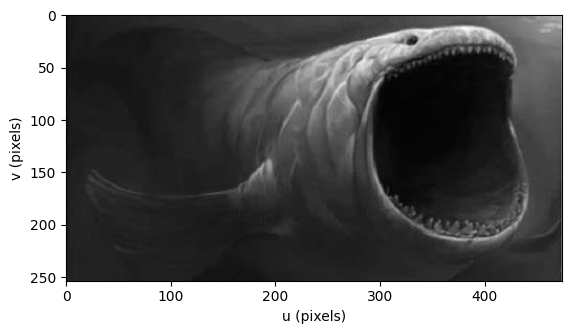

In [45]:
bloopgray = bloop.mono()
bloopgray.disp()

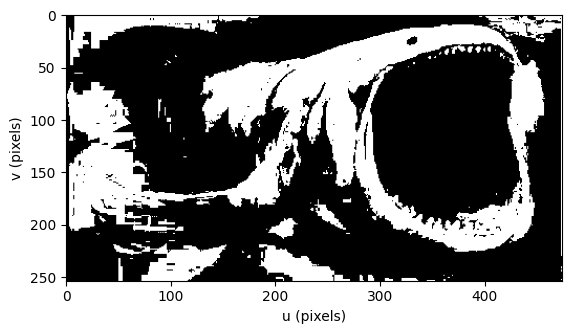

In [118]:
bloopgray.threshold_adaptive(h=50).disp();

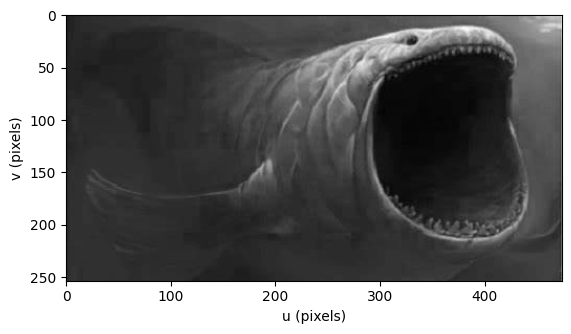

In [96]:
bloopB=bloop[:, :, 2]
bloopB.disp();


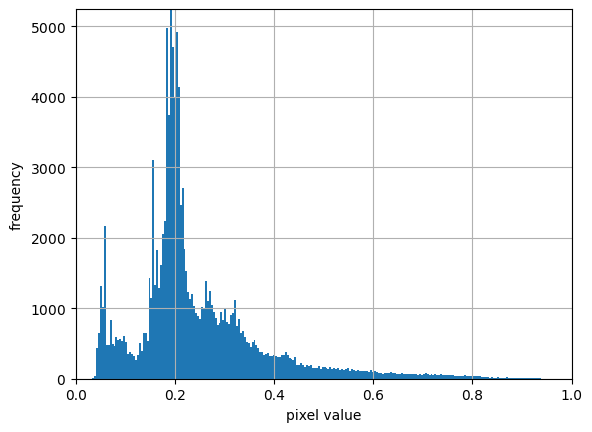

In [97]:
bloopB.hist().plot();

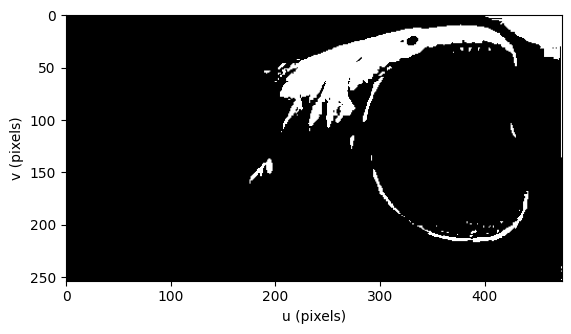

In [99]:
(bloopgray >= 0.4).disp();

In [53]:
L = Kernel.Laplace()

array([[ 0,  1,  0],
       [ 1, -4,  1],
       [ 0,  1,  0]])

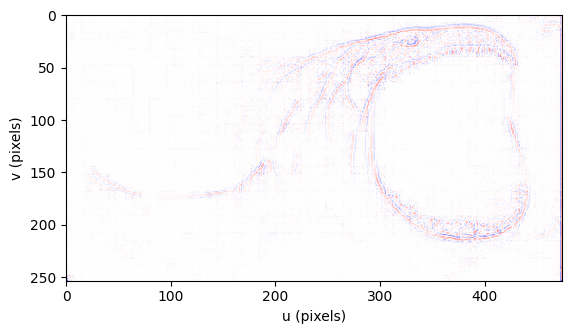

In [100]:
bloopB.convolve(L).disp(colormap="signed");

In [103]:
out = bloopB.window(np.var, h=4);

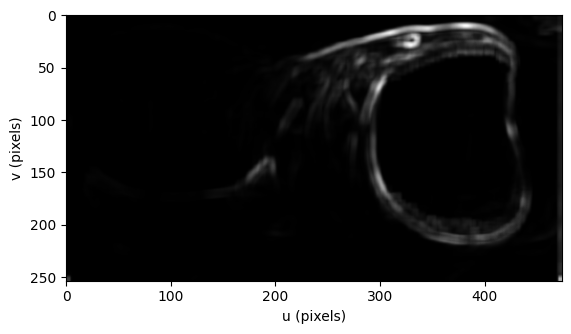

In [104]:
out.disp()

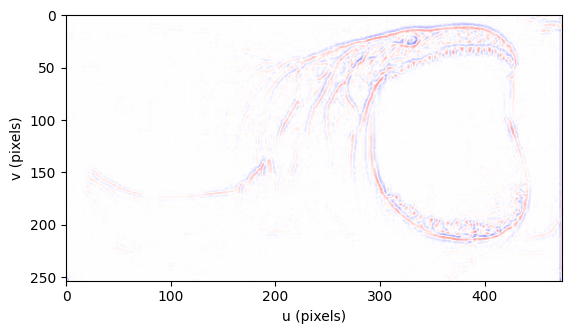

In [107]:
lap = bloopB.convolve(Kernel.LoG(sigma=1));
lap.disp(colormap="signed")

In [34]:
castle = Image.Read("castle.png", dtype="float");

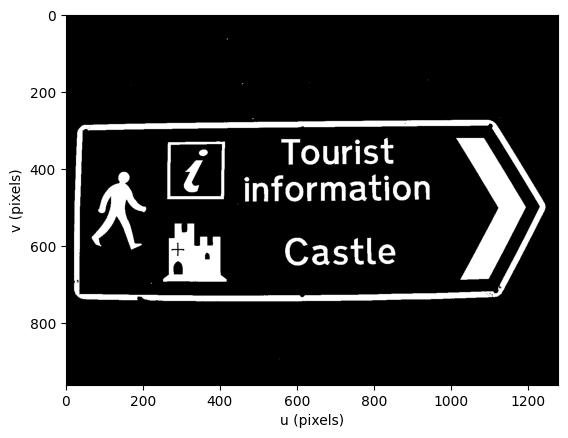

In [40]:
(castle >= 0.7).disp();  #Применяет пороговую обработку к изображению, выбирая пиксели с интенсивностью
                         #больше или равной 0.7. Это выделяет светлые области изображения,
                         #которые могут соответствовать интересующим объектам или регионам.
                         #Результат отображается, позволяя визуально оценить эффективность порога.

In [85]:
#castle.ithresh() # Метод для автоматического определения оптимального порога интенсивности
                   #на основе изображения. Методика не описана, но может включать такие алгоритмы, как Оцу.


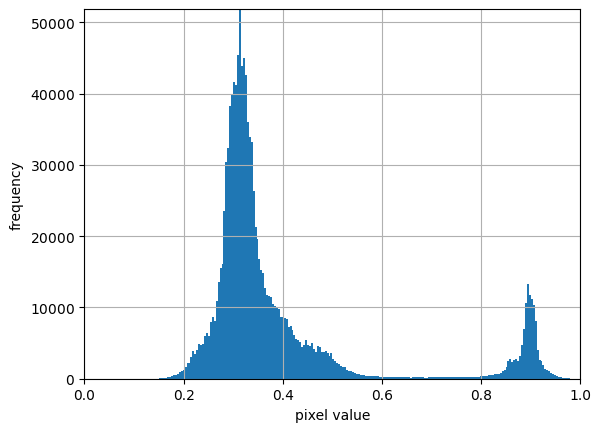

In [5]:
castle.hist().plot();   #Строит гистограмму распределения интенсивности пикселей изображения.
                         #Гистограмма помогает визуально определить пороги для разделения объектов и фона.

In [108]:
t = castle.otsu() # Вычисляет порог сегментации методом Оцу, который выбирает порог таким образом,
                    #чтобы минимизировать внутриклассовую вариацию интенсивности пикселей.

0.6039216

In [7]:
castle2 = Image.Read("castle2.png", dtype="float");

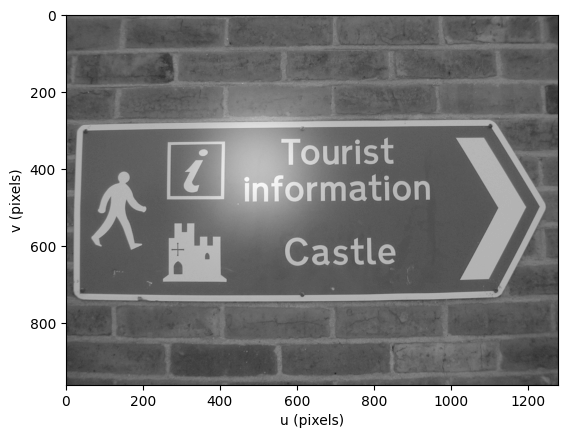

In [8]:
castle2.disp()

In [8]:
t = castle2.otsu()

0.59607846

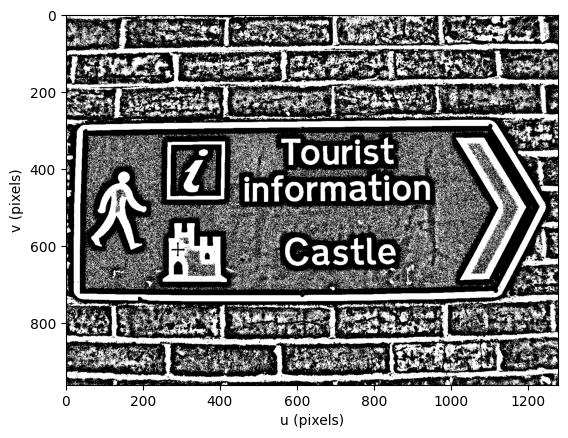

In [9]:
castle2.threshold_adaptive(h=15).disp(); # Применяется адаптивная пороговая обработка к castle2,
                                            # где порог определяется локально для каждой небольшой области изображения
                                            #с размером окна h=15. Это позволяет эффективно сегментировать изображение
                                            # в условиях переменной освещенности. Результат отображается для визуальной оценки.

### 12.1.1.2 Color Image Classification


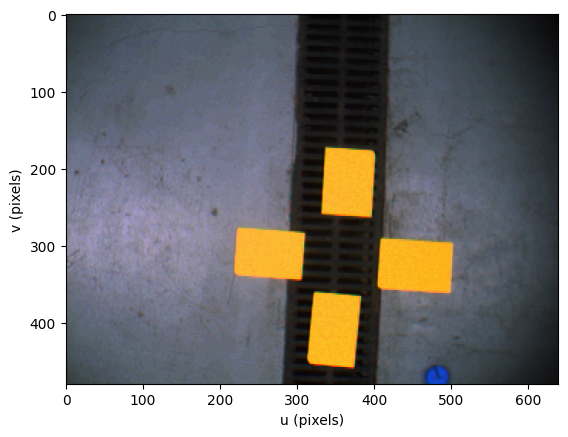

In [123]:
# Загрузка и отображение изображений
targets = Image.Read("yellowtargets.png", dtype="float", gamma="sRGB"); # Загружает цветное изображение "yellowtargets.png",
       #преобразуя его во внутреннее представление с плавающей точкой (dtype="float")
       #и корректируя гамму для sRGB цветового пространства.
       #Это улучшает точность цветов при последующем анализе.
targets.disp();

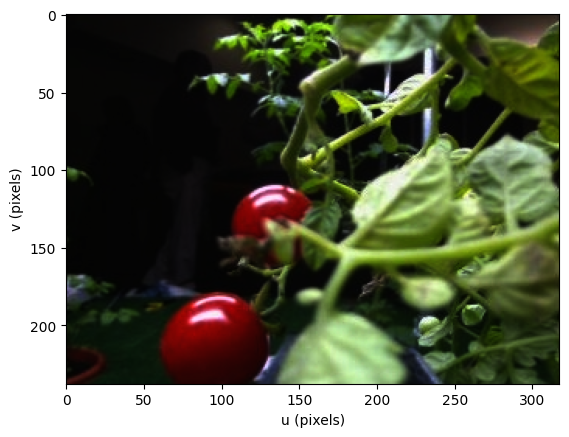

In [121]:
garden = Image.Read("tomato_124.png", dtype="float", gamma="sRGB");
garden.disp();

In [124]:
ab = targets.colorspace("L*a*b*").plane("a*:b*") #Преобразует изображение из sRGB в цветовое пространство Lab*,
      #которое лучше соответствует восприятию цвета человеком, облегчая классификацию по цветам.
         #Выбирает компоненты a* и b* из преобразованного изображения, отбрасывая компоненту яркости L*.
         #Это упрощает анализ цвета, сосредотачиваясь на хроматических компонентах.

Image: 640 x 480 (float32), a*:b*

In [127]:
abc = targets.colorspace("L*a*b*")

Image: 640 x 480 (float32), L*:a*:b*

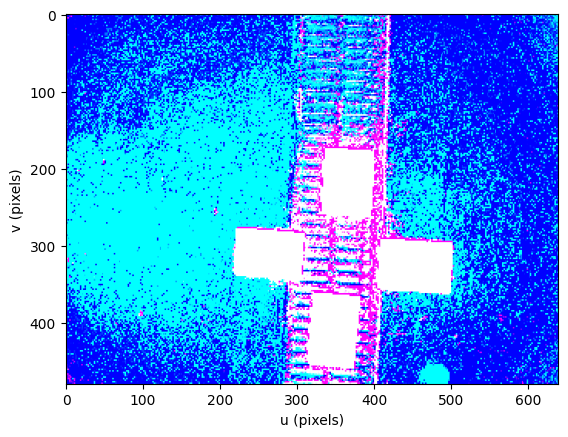

In [128]:
abc.disp()

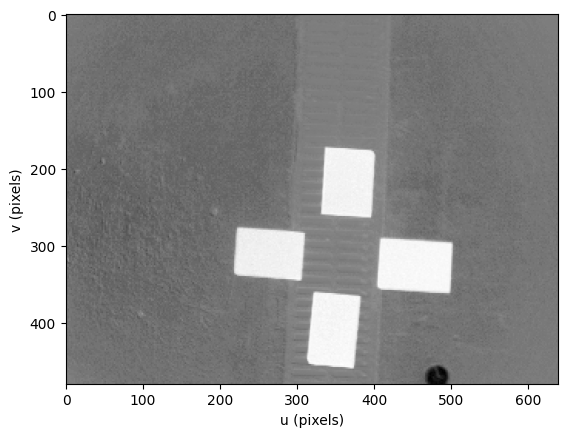

In [135]:
ab.plane("b*:").disp(); #Отображает только компоненту b*, которая указывает на цвет от синего к желтому,
                       # для визуализации распределения этого цветового компонента на изображении.

In [140]:
# Кластеризация цветов с помощью K-means
targets_labels, targets_centroids, resid = ab.kmeans_color(k=2, seed=0)
   #ab.kmeans_color(k=2, seed=0): Применяет алгоритм K-means для кластеризации пикселей изображения
   #на основе их цвета в пространстве a*b*, разделяя их на 2 кластера.
      #Параметр seed=0 обеспечивает воспроизводимость результатов.
      #Возвращает метки кластеров для каждого пикселя, центроиды кластеров и
      #остаточную сумму квадратов (меру внутрикластерного расстояния).


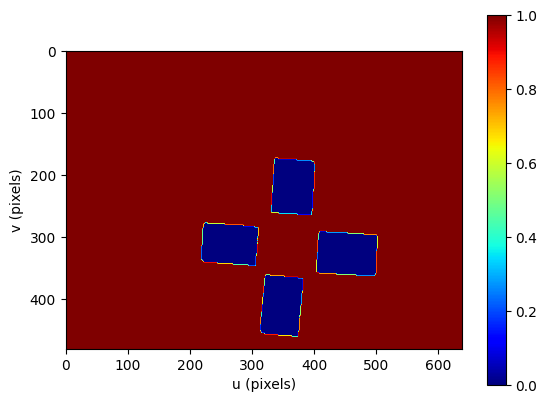

In [141]:
targets_labels.disp(colormap="jet", colorbar=True);
        #Отображает карту меток кластеров, используя цветовую карту "jet" для визуализации различных кластеров.

In [142]:
targets_centroids

array([[   14.71,    1.106],
       [   73.63,   -6.511]], dtype=float32)

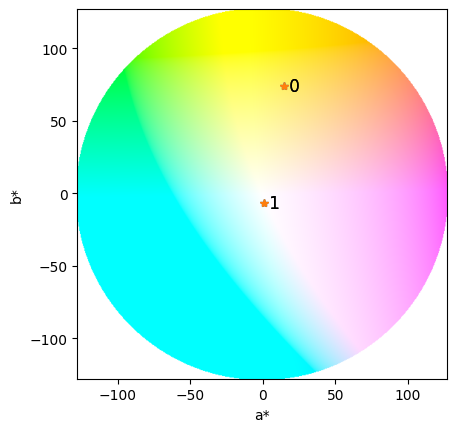

In [147]:
with plt.ioff():  # который предназначен для выполнения операций визуализации без
                  #немедленного отображения результатов в интерактивном режиме.
#библиотеки Matplotlib для временного отключения интерактивного режима отображения графиков.
#В интерактивном режиме графики отображаются сразу после вызова функции их создания, что полезно в интерактивных средах,
# таких как Jupyter Notebooks. Однако, при использовании plt.ioff(), создание графиков происходит "в фоне",
#и для их отображения необходимо явно вызвать plt.show() после завершения блока.
    plot_chromaticity_diagram(colorspace="a*b*");  #Предполагается, что это пользовательская или специализированная
                                                   # функция для отображения диаграммы хроматичности в
                                                   #цветовом пространстве a*b* из модели Lab*.
    plot_point(targets_centroids, marker="*", text="{}"); #Эта функция, вероятно, предназначена для отображения точек
                                                          #на диаграмме хроматичности, где targets_centroids представляют
                                                          #собой координаты центроидов кластеров, найденных в результате
                                                          #алгоритма K-means. Параметры marker="*" и text="{}"
                                                          #указывают на стиль отображения точек и текста рядом с ними.
                                                          # В данном случае, звездочками * обозначаются центроиды,
                                                          #а {} может быть форматом для вывода дополнительной информации
                                                          #рядом с каждой точкой.
plt.show()  #plt.show() после блока гарантирует, что все созданные графики будут
             #отображены пользователю, даже если интерактивный режим был временно отключен.

In [144]:
[color2name(c, "a*b*") for c in targets_centroids.T]  #Конвертирует координаты центроидов в названия цветов,
                                                      #если возможно, для интерпретации доминирующих цветов в изображении.

['xkcd:squash', 'ghostwhite']

In [19]:
resid / ab.npixels #Вычисляет среднее внутрикластерное расстояние на пиксель,
                    #давая представление о степени "разброса" каждого кластера.

59.108701643926096

Применение найденных центроидов для сегментации другого изображения

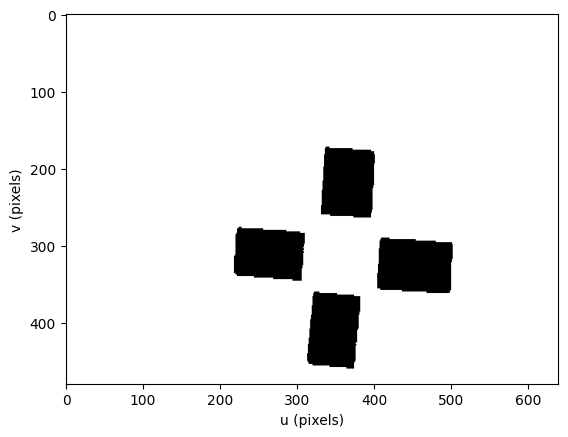

In [148]:
labels = ab.kmeans_color(centroids=targets_centroids)
      #Применяет кластеризацию набору данных
      #используя ранее найденные центроиды для сегментации изображения.
      #Это позволяет классифицировать пиксели на основе их принадлежности к одному из кластеров.
labels.disp()

In [152]:
objects = (labels == 0) #(labels == 0): Выбирает объекты, соответствующие первому кластеру.
#objects.disp()

Image: 640 x 480 (bool)

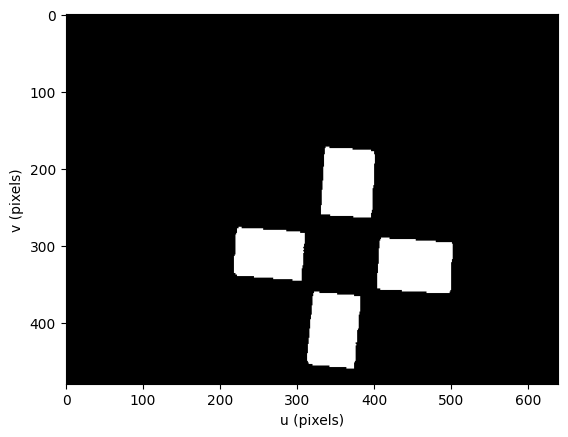

In [153]:
objects.disp();

In [180]:
ab = garden.colorspace("L*a*b*").plane("a*:b*")
   #garden.colorspace("L*a*b*"): Преобразует цветное изображение сада из его исходного
   #цветового пространства в цветовое пространство Lab*, которое лучше соответствует
   #восприятию цвета человеком и полезно для анализа цветовых различий.
      #.plane("a*:b*"): Извлекает компоненты a* и b* преобразованного изображения,
      #отбрасывая компоненту яркости L*, для фокусировки на хроматических характеристиках.

garden_labels, garden_centroids, resid = ab.kmeans_color(k=3, seed=0); #ab.kmeans_color(k=3, seed=0): Применяет алгоритм k-means
                                                    # для кластеризации пикселей изображения ab на основе их цветов в пространстве
                                                    #a*b* на 3 кластера.
                                                      #Параметр seed=0 обеспечивает воспроизводимость результатов.
                                                        #garden_labels  Возвращает метки кластеров для каждого пикселя
                                                           #garden_centroids центроиды кластеров
                                                             #resid  oстаточную сумму квадратов
print(garden_centroids )    #Отображает координаты центроидов кластеров, найденных в процессе кластеризации.
print("метки кластеров для каждого пикселя",garden_labels) #
print("oстаточную сумму квадратов", resid) #oстаточную сумму квадратов

[[  -19.46   -1.375    39.86]
 [   31.04    2.673    24.09]]
метки кластеров для каждого пикселя Image: 318 x 238 (int32)
oстаточную сумму квадратов 7656088.683109842


In [156]:
qaz = garden.colorspace("L*a*b*")

Image: 318 x 238 (float32), L*:a*:b*

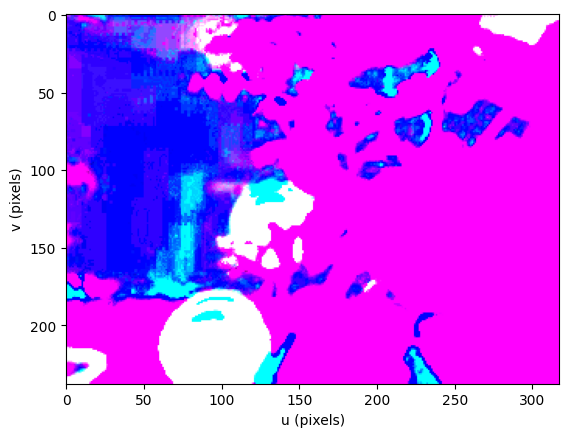

In [157]:
qaz.disp()

In [174]:
qazw = qaz.plane("a*:b*")
#qazw.show()

Image: 318 x 238 (float32), a*:b*

In [181]:
[color2name(c, "a*b*") for c in garden_centroids.T] #Конвертирует координаты центроидов в названия цветов,
           #если это возможно, основываясь на их расположении в пространстве a*b*.
           #Это помогает интерпретировать, какие цвета были идентифицированы как доминирующие.

['xkcd:military green', 'xkcd:grey', 'xkcd:dark salmon']

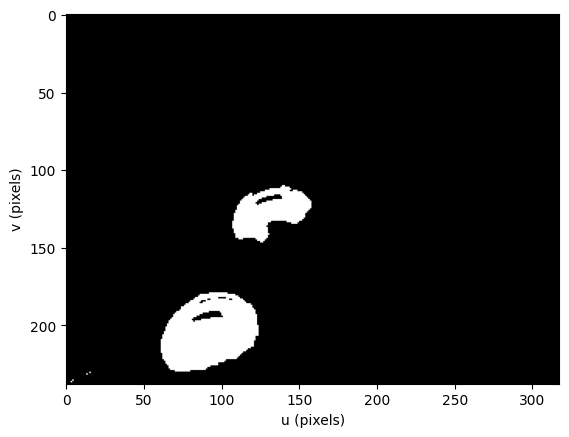

In [188]:
#Выделение томатов на изображении
tomatoes = (garden_labels == 2); #Создает маску для выделения томатов, предполагая, что томаты соответствуют пикселям,
                                 #отнесенным к кластеру с меткой 2.
tomatoes.disp()

In [191]:
#Кластеризация с использованием библиотеки SciPy
data = np.random.rand(500, 2);  # 500 x 2D data points
 #Генерирует 500 случайных двумерных точек данных для демонстрации применения k-means в общем случае.

In [193]:
from scipy.cluster.vq import kmeans2
centroids, labels = kmeans2(data, k=3)
     #Импортирует функцию kmeans2 из scipy.cluster.vq и применяет её к сгенерированным данным data,
     #разделяя их на 3 кластера. Возвращает центроиды кластеров и метки для каждой точки данных.
print("центроиды",centroids) #
print("метки", labels) #oстаточную сумму квадратов

центроиды [[  0.7568   0.3238]
 [  0.5279   0.8168]
 [  0.2093   0.3621]]
метки [0 0 0 0 2 2 2 2 1 1 2 2 0 2 0 1 2 1 0 0 0 1 1 0 0 0 0 0 1 0 2 1 0 2 1 2 0 2 0 1 0 0 1 0 0 2 1 2 0 1 2 0 0 1 2 2 2 0 1
 2 0 2 0 1 0 1 1 2 0 2 0 2 0 0 0 1 1 2 0 2 1 1 1 2 0 2 1 2 0 1 0 0 0 0 1 0 1 0 1 2 2 1 0 1 0 0 0 0 2 1 0 1 0 2 1 0 1 0
 2 2 0 2 2 1 1 1 0 1 1 0 1 0 1 1 2 2 0 2 2 1 1 0 2 1 1 0 1 1 2 0 1 0 2 0 0 1 0 0 0 0 0 1 0 2 0 0 2 0 0 1 2 1 1 2 2 2 0
 0 1 2 1 2 1 0 2 2 1 2 1 1 2 2 2 1 2 1 0 0 2 0 1 2 1 2 2 1 0 2 2 2 1 1 1 2 2 0 1 1 2 2 2 1 1 0 0 0 0 0 0 2 1 1 0 2 0 2
 0 2 2 2 2 1 1 1 1 0 0 0 1 2 0 1 0 2 1 1 1 0 0 2 2 1 2 0 0 2 1 1 0 0 0 1 1 0 1 1 1 1 0 0 1 2 0 2 2 1 0 0 0 1 1 1 1 2 2
 2 1 2 2 1 2 1 2 1 0 1 0 0 2 0 2 1 1 0 1 0 0 1 0 2 1 0 0 0 0 0 2 0 2 0 1 2 2 0 0 1 1 1 0 1 1 2 1 2 0 1 1 2 2 0 2 0 0 2
 1 1 2 2 1 2 2 0 0 1 2 0 0 0 2 1 2 0 2 0 1 2 2 0 2 0 2 0 0 2 2 0 2 2 0 2 2 0 0 2 0 1 0 1 2 0 2 2 1 1 2 1 0 0 2 0 0 2 0
 0 1 2 0 1 0 2 1 1 1 0 0 1 2 2 1 1 1 2 1 1 0 1 2 1 2 0 0 1 2 1 0 0 0 1 2 0 2 1 0 0 2 2 

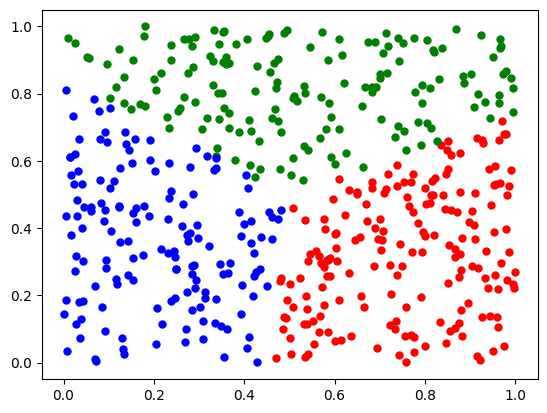

In [196]:
for i in range(3):  #Цикл for выполняется три раза, что соответствует количеству кластеров k=3,
                    #заданных для алгоритма K-means. Индекс i принимает значения от 0 до 2,
                    #что позволяет итерироваться по каждому кластеру.
  plot_point(data[labels==i, :].T, color="rgb"[i], marker=".", markersize=10)

     #plot_point(data[labels==i, :].T, color="rgb"[i], marker=".", markersize=10): Этот вызов функции отвечает
     # за визуализацию точек, принадлежащих к текущему кластеру i.
        #data[labels==i, :]: Из всего набора данных data, который представляет собой массив размером 500x2
        #(500 точек в 2D пространстве), выбираются только те точки, метки labels которых совпадают с
        #текущим значением i. Это означает, что из всего набора данных выбираются точки, принадлежащие к i-тому кластеру.
           #.T: Оператор транспонирования меняет местами строки и столбцы выбранных точек данных,
           #преобразуя их в формат, подходящий для функции plot_point. В результате каждый столбец транспонированной
           #матрицы представляет собой координаты (x, y) группы точек для отображения.
              #color="rgb"[i]: Определяет цвет для визуализации i-того кластера.
              #Строка "rgb" содержит три символа, каждый из которых соответствует цвету (красный, зеленый, синий).
              #Индексация этой строки с помощью [i] выбирает соответствующий цвет для текущего кластера.
                 #marker=".": Указывает на использование точечного маркера для отображения точек.
                   #markersize=10: Задает размер маркера, делая точки более заметными на графике.


Этот код демонстрирует применение морфологической операции закрытия к бинарному изображению, представляющему сегментированные объекты (в данном случае, предположительно, помидоры), для улучшения качества сегментации путем заполнения промежутков и устранения небольших дыр внутри объектов.

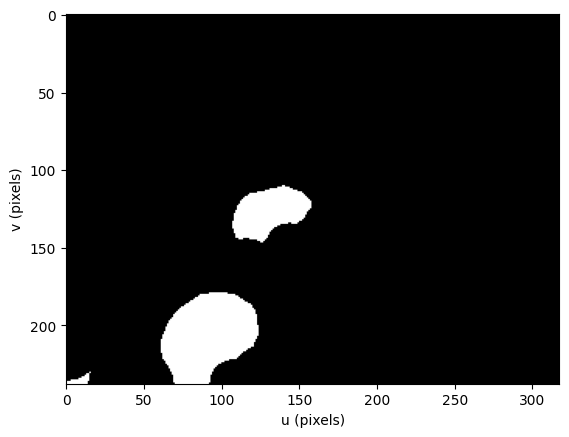

In [197]:
tomatoes_binary = tomatoes.close(Kernel.Circle(radius=15)); #tomatoes.close(...): Морфологическая операция закрытия
                                                            #применяется к бинарному изображению tomatoes, которое получено
                                                            #на предыдущем этапе

     #Kernel.Circle(radius=15): Создает структурирующий элемент в форме круга с радиусом 15 пикселей.
     #Форма и размер структурирующего элемента определяют, как будет изменяться изображение в результате морфологической операции.
     #В данном случае, круглый структурирующий элемент помогает равномерно расширить и затем сузить объекты на изображении,
     #эффективно устраняя мелкие дыры и промежутки.

# Операция закрытия состоит из последовательного применения дилатации (расширения объектов),
#за которой следует эрозия (сужение объектов). Это помогает "закрыть" маленькие промежутки и отверстия в объектах,
#делая границы более гладкими и устраняя мелкий шум вокруг объектов.

tomatoes_binary.disp();

### 12.1.1.3 Semantic Classification


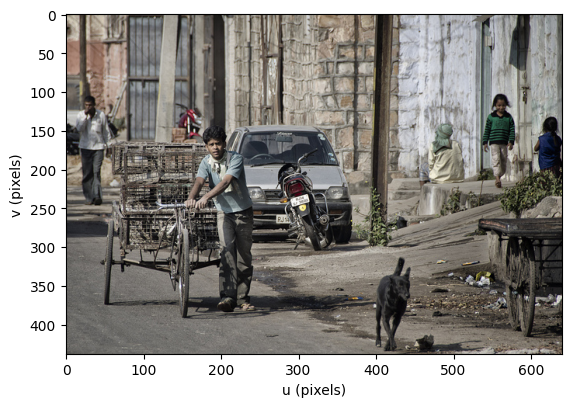

In [202]:
scene = Image.Read("image3.jpg")
scene.disp();

In [2]:
try:
    import torch
    import torchvision as tv
except ModuleNotFoundError:
        print("please install PyTorch:  pip install torch torchvision")

In [203]:
transform = tv.transforms.Compose([
    #tv.transforms.Compose(...): Создает составное преобразование, которое будет
    #применено к изображению перед его подачей в модель.

   tv.transforms.ToTensor(),
    #Преобразует изображение в тензор PyTorch, изменяя порядок каналов и масштабируя пиксели в диапазон [0, 1].

   tv.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])]);
    #Нормализует тензор изображения, вычитая среднее и деля на стандартное отклонение по каждому каналу.
    #Значения среднего и стандартного отклонения соответствуют общепринятым значениям,
    #используемым при обучении моделей на ImageNet.

in_tensor = transform(scene.image); #Применяет заданное составное преобразование к изображению scene,
                                    #подготавливая его к классификации.

In [3]:
# Загрузка предварительно обученной модели и выполнение сегментации
model = tv.models.segmentation.fcn_resnet50(pretrained=True).eval();
   #Загружает предварительно обученную модель FCN (Fully Convolutional Network) с архитектурой ResNet-50,
   #переводит её в режим оценки .eval(), готовя к использованию для сегментации изображений.

outputs = model(torch.stack([in_tensor]));
                #torch.stack([in_tensor]): Оборачивает тензор изображения в дополнительное измерение,
                #создавая пакет размером 1 для модели, после чего модель выполняет сегментацию изображения.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=FCN_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fcn_resnet50_coco-1167a1af.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet50_coco-1167a1af.pth
100%|██████████| 135M/135M [00:01<00:00, 106MB/s] 


NameError: name 'in_tensor' is not defined

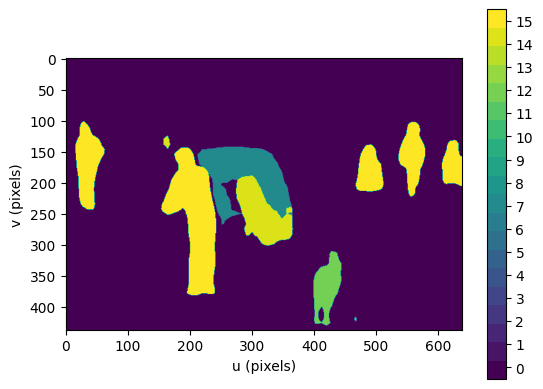

In [205]:
#Обработка выходных данных модели
labels = Image(torch.argmax(outputs["out"].squeeze(), dim=0).detach().cpu().numpy());
              #torch.argmax(outputs["out"].squeeze(), dim=0): Выбирает метки классов
              #с наивысшей вероятностью для каждого пикселя, удаляя избыточные измерения с
                                          #.squeeze() и преобразуя тензор в массив NumPy.

labels.disp(colormap="viridis", ncolors=20, colorbar=True);
             #Отображает семантическую карту меток с использованием цветовой карты
             #"viridis", позволяя визуально различить сегментированные классы на изображении.

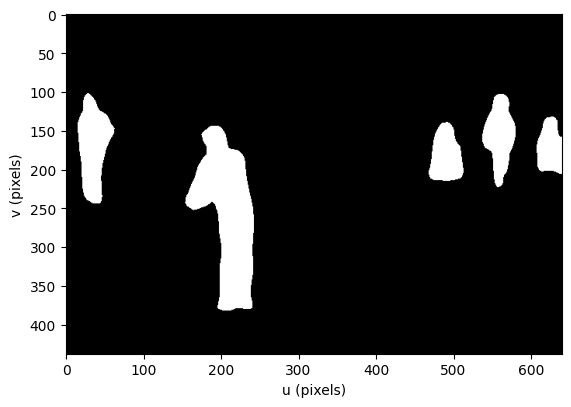

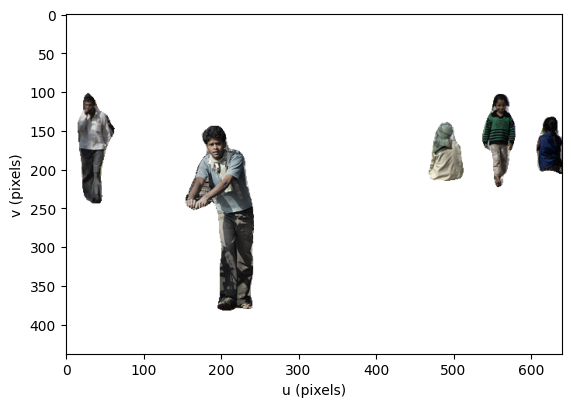

In [210]:
#Визуализация определенных классов и применение маски
(labels == 15).disp(); # Отображает бинарную маску для класса с меткой 15, выделяя соответствующие области на изображении.

scene.choose([255, 255, 255], labels != 15).disp(); #Применяет к изображению scene маску, где все пиксели,
                                                    #не принадлежащие классу 15, заменяются на белый цвет,
                                                    #выделяя тем самым объекты этого класса на сцене.

## 12.1.2 Object Instance Representation
### 12.1.2.1 Creating Binary Blobs


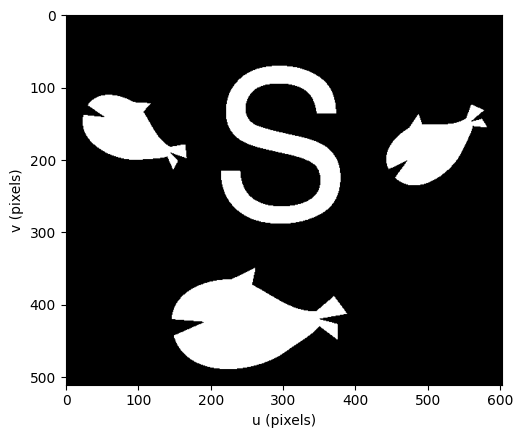

In [227]:
sharks = Image.Read("sharks.png");
sharks.disp();

In [228]:
labels, m = sharks.labels_binary()
   #sharks.labels_binary(): Применяет алгоритм сегментации к изображению sharks
   #для выделения отдельных объектов (блобов) на бинарном изображении.
   #Функция возвращает два значения: labels, матрицу меток, где каждый уникальный объект
   #на изображении имеет свою уникальную метку, и m, количество уникальных объектов (блобов).
m  #Просто выводит значение m, количество обнаруженных объектов на изображении.

5

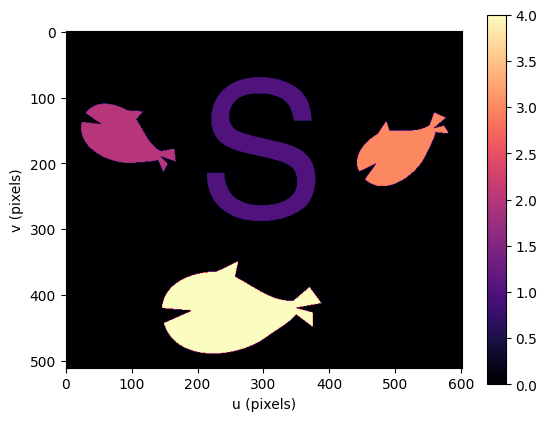

In [234]:
labels.disp(colorbar=True, colormap="magma"); #labels.disp(colorbar=True): Отображает изображение меток с цветовой шкалой
                            #(colorbar=True). Каждый уникальный цвет на изображении
                            #представляет отдельный объект (акулу).

#labels.disp(colorbar=True, colormap='plasma')
#Последовательные цветовые карты (Sequential colormaps): Подходят для данных с порядком или значением,
#которые увеличиваются или уменьшаются от одного к другому.
#Примеры включают "viridis", "plasma", "inferno", "magma" и "cividis".

#Дивергентные цветовые карты (Diverging colormaps): Подходят для данных, которые имеют определенное среднее значение
#и распределены в обе стороны от него. Примеры включают "coolwarm", "RdBu", "seismic" и "PuOr".

#Качественные цветовые карты (Qualitative colormaps): Подходят для категориальных данных или данных без порядка.
#Примеры включают "tab10", "tab20", "tab20b", "tab20c" и "Set3".

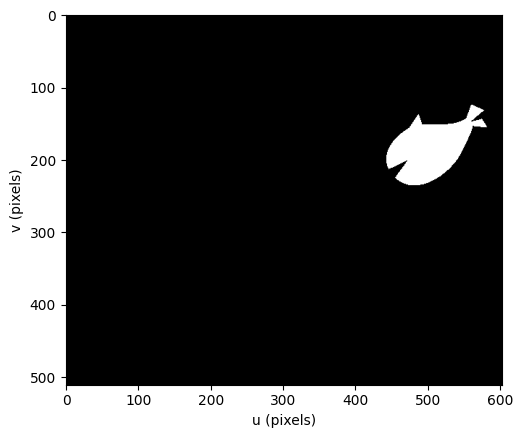

In [235]:
right_shark = (labels == 3); # Создает бинарную маску для объекта с меткой 3.
                              #Это выражение выделяет одну конкретную акулу из всех обнаруженных объектов,
right_shark.disp();

### 12.1.2.2 Maximally Stable Extremal Regions (MSER)


Максимально стабильные экстремальные регионы (MSER)

In [236]:
labels, m = castle2.labels_MSER()
    #castle2.labels_MSER(): Применяет алгоритм MSER к другому изображению
    #для выделения стабильных светлых и темных регионов, которые хорошо отличаются
    #от своего окружения на разных уровнях интенсивности.
    #Алгоритм возвращает матрицу меток labels и количество уникальных регионов m

In [237]:
m #Выводит количество обнаруженных уникальных экстремальных регионов на изображении.

394

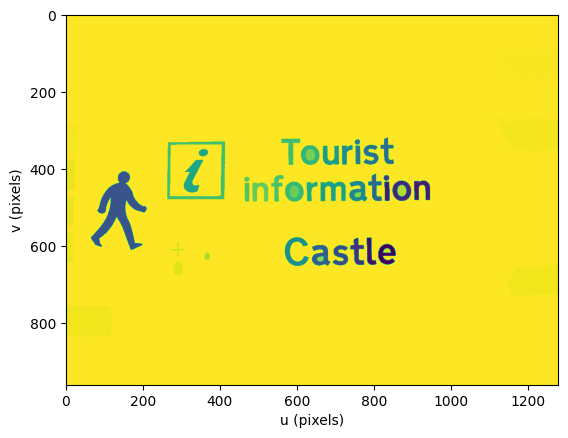

In [240]:
labels.disp(colormap="viridis_r", ncolors=m);  #Отображает изображение меток, используя инвертированную цветовую карту
                                               #"viridis" (viridis_r), с количеством цветов, равным количеству обнаруженных регионов
                                               #m. Это позволяет визуально различить каждый уникальный регион,
                                               #выделенный алгоритмом MSER.

### 12.1.2.3 Graph-Based Segmentation


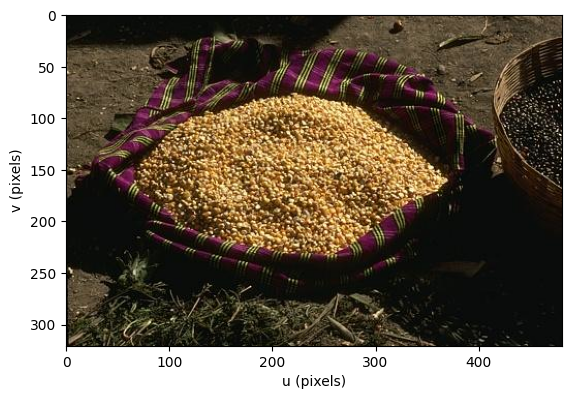

In [43]:
grain = Image.Read("58060.png")
grain.disp();

In [44]:
labels, m = grain.labels_graphseg()
          #Применяет метод сегментации на основе графов к изображению grain.
          #Этот метод анализирует структуру изображения, преобразуя его в граф,
          #где пиксели или группы пикселей представлены узлами, а рёбра отражают их взаимосвязь.
          #Сегментация достигается путём разделения графа на подграфы.
          #Возвращает labels — метки сегментов, и m — общее количество уникальных сегментов.
m  #Выводит количество обнаруженных уникальных сегментов на изображении.

27

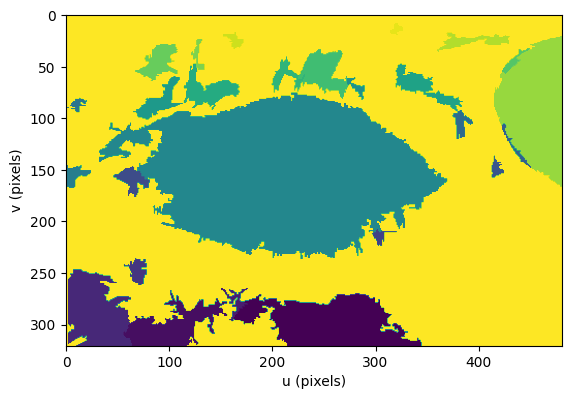

In [45]:
labels.disp(colormap="viridis_r", ncolors=m);
        #Отображает карту сегментации с использованием инвертированной цветовой схемы "viridis".
        #Количество цветов (ncolors=m) соответствует числу обнаруженных сегментов.
        #Это позволяет визуально различать каждый сегмент на изображении.

## 12.1.3 Object Instance Description
### 12.1.3.1 Area


In [46]:
right_shark.sum()
        #Вычисляет сумму значений в массиве right_shark, который представляет бинарную маску определённого объекта
        #(в данном случае, предположительно, "правой акулы" из предыдущего примера).
        #Поскольку бинарная маска содержит значения 1 для пикселей, принадлежащих объекту, и 0 для фона,
        #сумма этих значений напрямую соответствует площади объекта в пикселях.
        #Это позволяет оценить размер объекта на изображении.

7728

### 12.1.3.2 Bounding Boxes


In [242]:
u, v = right_shark.nonzero()
        # Возвращает кортеж индексов ненулевых элементов (пикселей, принадлежащих объекту)
        #в бинарной маске right_shark. u содержит индексы строк (вертикальные координаты),
        #а v - индексы столбцов (горизонтальные координаты) этих пикселей.
u
v

array([124, 124, 124, ..., 234, 234, 234])

In [48]:
u.shape
         #Возвращает размерность массива u, что дает представление о количестве пикселей,
         #принадлежащих объекту по вертикали.

(7728,)

In [245]:
      #Эти строки вычисляют минимальные и максимальные значения индексов u и v,
      #определяя таким образом границы ограничивающей рамки объекта. umin и umax задают вертикальные границы,
      #а vmin и vmax - горизонтальные.

umin = u.min()
umax = u.max()
vmin = v.min()
vmax = v.max()


234

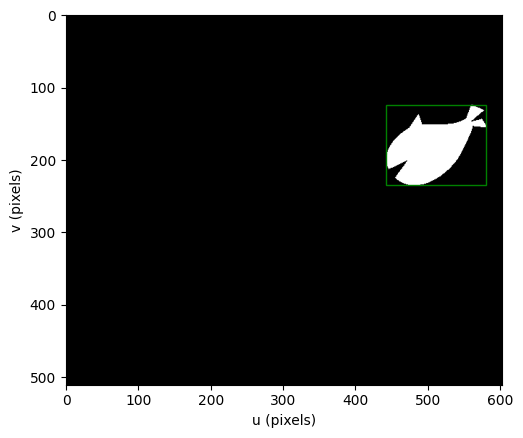

In [50]:
right_shark.disp(block=None);  # display it again, it was a few cells back
                    # Отображает бинарную маску right_shark снова для визуального контекста.
                    # Параметр block=None может быть использован для немедленного отображения
                    #без блокировки выполнения последующего кода,

plot_box(lrbt=[umin, umax, vmin, vmax], color="g");  # Визуализирует ограничивающую рамку вокруг объекта
                    #с использованием ранее вычисленных границ.
                    #lrbt означает "left, right, bottom, top" (левая, правая, нижняя, верхняя границы),
                    #хотя в данном контексте
                    #umin и umax относятся к верхней и нижней границам, а
                    #vmin и vmax - к левой и правой.
                    #Цвет рамки задается параметром color="g" (зеленый).



### 12.1.3.3 Moments


In [247]:
m00 = right_shark.mpq(0, 0) # Вычисляет нулевой геометрический момент (m00),
                            #который представляет собой сумму всех пикселей в бинарной маске right_shark
                            #и эквивалентен ее площади.

7728

In [248]:
    #Эти строки вычисляют координаты центра тяжести (центроид) объекта. uc и vc
    #представляют горизонтальную и вертикальную координаты центроида соответственно,
    #вычисляемые как первые моменты по каждому направлению, деленные на m00.

uc = right_shark.mpq(1, 0) / m00
vc = right_shark.mpq(0, 1) / m00
print(uc)
print(vc)

502.4980590062112
183.72851966873705


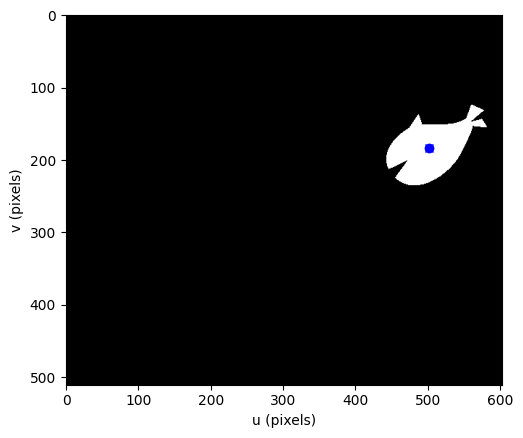

In [252]:
      #Снова отображает бинарную маску right_shark и визуализирует центроид с помощью plot_point,
      #где (uc, vc) - координаты центроида,
      #"bo" и "bx" могут обозначать стиль отображения точки где b - голубой цвет.
right_shark.disp(block=None);  # display it again, it was a few cells back
plot_point((uc, vc), ["bo", "bx"]);

In [254]:
#Вычисляет центральные моменты второго порядка для объекта, необходимые для определения ориентации и формы
u20 = right_shark.upq(2, 0);
u02 = right_shark.upq(0, 2);
u11 = right_shark.upq(1, 1);

#Создает матрицу инерции J на основе центральных моментов. Эта матрица используется для анализа формы объекта
J = np.array([[u20, u11], [u11, u02]])

array([[7.83e+06, -2.917e+06],
       [-2.917e+06, 4.733e+06]])

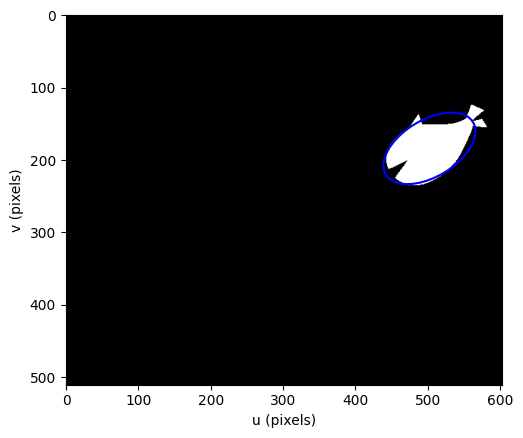

In [255]:
right_shark.disp(block=None);  # Отображает бинарную маску right_shark и визуализирует эллипс,
                              #соответствующий форме и ориентации объекта.

plot_ellipse(4 * J  / m00, centre=(uc, vc), inverted=True, color="blue");
                               # Эллипс вычисляется на основе масштабированной матрицы инерции J,
                               # где масштабирующий коэффициент 4 / m00 и центрируется в точке (uc, vc).
                               #Параметр inverted=True может использоваться для коррекции ориентации эллипса,
                               #а color="blue" задает его цвет.

Вычисление собственных значений и векторов матрицы инерции

In [257]:
lmbda, x = np.linalg.eig(J) #np.linalg.eig(J): Вычисляет собственные значения (lmbda)
                            #и собственные векторы (x) матрицы инерции J.
                            #Собственные значения отражают величину (размер) осей эллипса,
                            #а собственные векторы указывают их ориентацию.
lmbda  #Выводит собственные значения матрицы J, которые будут использованы для расчета размеров эллипса.

array([9.584e+06, 2.979e+06])

In [258]:
#Рассчитывает длины полуосей эллипса a и b.
a = 2 * np.sqrt(lmbda.max() / m00) #a — длина большей полуоси, вычисляется как удвоенный квадратный корень
                                   #из максимального собственного значения,
                                   #деленного на нулевой момент (m00, который эквивалентен площади объекта).

b = 2 * np.sqrt(lmbda.min() / m00) # b — длина меньшей полуоси, вычисляется аналогично из минимального собственного значения.

print(a)
print(b)

70.43125873533421
39.26627935229943


In [58]:
b / a  #Вычисляет отношение длин меньшей и большей полуосей эллипса.
       #Это значение может использоваться для оценки степени вытянутости объекта
       #(как близко форма объекта к кругу или, наоборот, к удлиненному эллипсу).

0.5575121055248183

Анализ собственных векторов

In [59]:
x #Выводит собственные векторы матрицы J. Каждый вектор представляет собой направление одной из осей эллипса.

array([[   0.857,   0.5153],
       [ -0.5153,    0.857]])

In [60]:
i = np.argmax(lmbda)  # Находит индекс максимального собственного значения, что соответствует направлению большей оси эллипса.
v = x[:, i]           #Выбирает собственный вектор, соответствующий максимальному собственному значению.
                      #Этот вектор указывает направление большей оси эллипса относительно изображения.

array([   0.857,  -0.5153])

Вычисление угла ориентации эллипса

In [61]:
np.rad2deg(np.arctan2(v[1], v[0]))
          #np.arctan2(v[1], v[0]): Вычисляет арктангенс отношения компонентов собственного вектора v,
          #что дает угол его наклона относительно горизонтальной оси изображения в радианах.
                #np.rad2deg(...): Преобразует угол из радиан в градусы.
                #Это значение представляет угол ориентации большей оси эллипса,
                #аппроксимирующего форму объекта на изображении.

-31.018486978211758

### 12.1.3.4 Blob Descriptors


Идентификация и базовый анализ блобов

In [263]:
blobs = sharks.blobs(); #Вызывает метод blobs на изображении sharks для идентификации и извлечения
#всех связных областей (блобов).
#Возвращает список объектов блобов, каждый из которых содержит информацию о соответствующей области на изображении.

In [264]:
blobs
#Просто выводит представление объекта blobs,
#что может дать общее представление о количестве найденных блобов и базовой информации о них.

┌───┬────────┬──────────────┬──────────┬───────┬────────┬────────┬────────┬────────┐
│id │ parent │     centroid │     area │ touch │  perim │ circul │ orient │ aspect │
├───┼────────┼──────────────┼──────────┼───────┼────────┼────────┼────────┼────────┤
│ 0 │     -1 │ 245.6, 425.9 │ 1.85e+04 │ False │  811.2 │  0.392 │  -1.0° │  0.561 │
│ 1 │     -1 │ 502.3, 183.9 │ 7.51e+03 │ False │  514.8 │  0.396 │ -30.9° │  0.562 │
│ 2 │     -1 │  82.9, 159.6 │ 7.52e+03 │ False │  513.4 │  0.399 │  28.9° │  0.562 │
│ 3 │     -1 │ 297.0, 180.0 │ 1.44e+04 │ False │ 1235.4 │  0.132 │ -95.6° │  0.701 │
└───┴────────┴──────────────┴──────────┴───────┴────────┴────────┴────────┴────────┘

In [265]:
len(blobs) #Возвращает количество обнаруженных блобов на изображении sharks.

4

In [266]:
blobs[3]
#Доступ к четвертому блобу в списке (индексация начинается с нуля).
#Это позволяет рассмотреть детальную информацию о конкретном блобе.

┌───┬────────┬──────────────┬──────────┬───────┬────────┬────────┬────────┬────────┐
│id │ parent │     centroid │     area │ touch │  perim │ circul │ orient │ aspect │
├───┼────────┼──────────────┼──────────┼───────┼────────┼────────┼────────┼────────┤
│ 3 │     -1 │ 297.0, 180.0 │ 1.44e+04 │ False │ 1235.4 │  0.132 │ -95.6° │  0.701 │
└───┴────────┴──────────────┴──────────┴───────┴────────┴────────┴────────┴────────┘

In [267]:
blobs[3].area #Возвращает площадь четвертого блоба, т.е. количество пикселей внутри этой области.

blobs[3].umin #Возвращает минимальное значение по вертикальной оси (ось U)
              #для четвертого блоба, что может указывать на его верхнюю границу на изображении.

blobs[3].aspect  #Возвращает соотношение сторон четвертого блоба,
                 #что может дать представление о его форме
                 #(как прямоугольной, так и более вытянутой или квадратной).

blobs[3].centroid  #Возвращает координаты центроида (центра масс) четвертого блоба.
                    #Центроид рассчитывается как средневзвешенное положение всех пикселей в блобе.

(297.0064432989691, 179.97242732423143)

In [268]:
blobs[3].moments.m00   # Возвращает нулевой момент (площадь) для четвертого блоба, аналогично .area.

blobs[3].moments.mu11  # Возвращает центральный момент первого порядка по обеим осям для четвертого блоба,
                       # что может использоваться для анализа ориентации блоба.

blobs[3].moments.nu03  # Возвращает нормализованный центральный момент третьего порядка по вертикальной оси,
                        # что может давать информацию о симметрии блоба.

-0.004654730339830461

In [274]:
a = blobs[3].moments.m00
b = blobs[3].moments.mu11
c = blobs[3].moments.nu02
print(a, '\n', b, '\n', c)


14356.0 
 3186981.800472498 
 0.31385251029644196


In [68]:
blobs.area #площадь

array([1.847e+04,     7510,     7523, 1.436e+04])

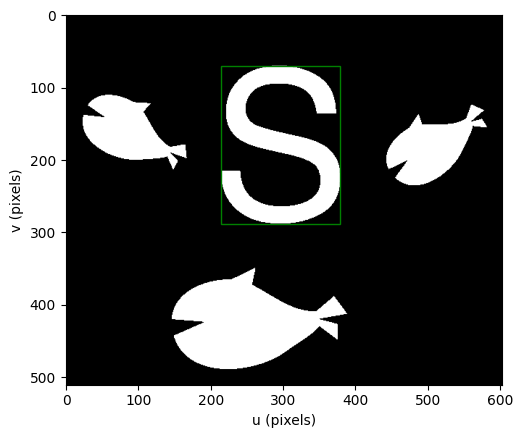

In [277]:
sharks.disp(block=None)  #Снова отображает изображение sharks для визуального контекста.
                         #Параметр block=None может использоваться в интерактивных средах.

blobs[3].plot_box(color="green") #Рисует ограничивающую рамку вокруг четвертого блоба цветом "зеленый".



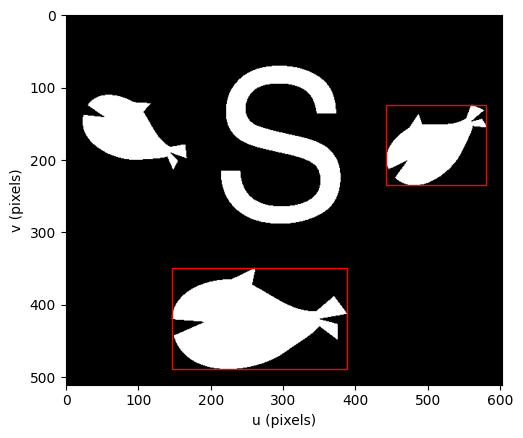

In [280]:
sharks.disp(block=None)
blobs[:2].plot_box(color="red") #Рисует ограничивающие рамки вокруг первых двух блобов в списке, также красным цветом.


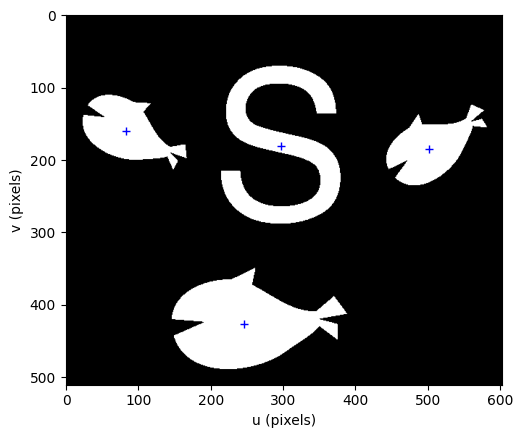

In [281]:
sharks.disp(block=None)
blobs.plot_centroid(marker="+", color="blue") #Визуализирует центроиды всех блобов с помощью синего крестика


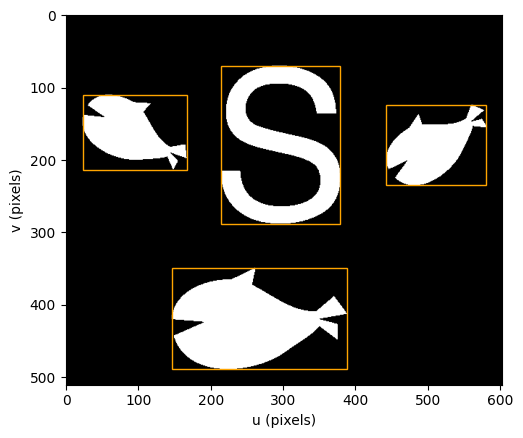

In [282]:
sharks.disp(block=None) #Рисует ограничивающие рамки вокруг всех блобов
blobs.plot_box(color="orange")

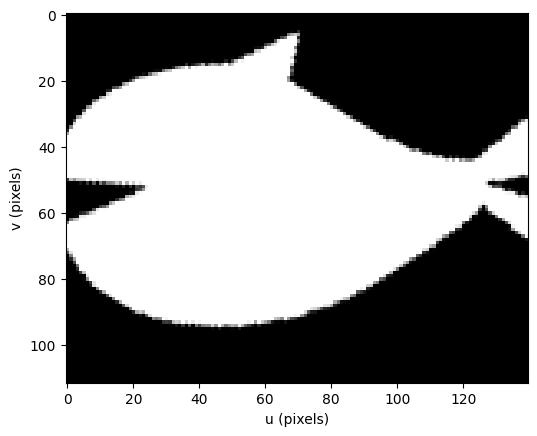

In [70]:
sharks.roi(blobs[1].bbox).rotate(blobs[1].orientation).disp();
      #Выделяет регион интереса (ROI) на изображении sharks, соответствующий ограничивающей рамке второго блоба,
      #поворачивает этот регион на угол, равный его ориентации, и отображает результат.
      #Это может использоваться для анализа конкретных блобов в изолированном виде.


In [71]:
blobs[blobs.area > 10_000] #Пытается отфильтровать блобы с площадью больше 10 000 пикселей.

┌───┬────────┬──────────────┬──────────┬───────┬────────┬────────┬────────┬────────┐
│id │ parent │     centroid │     area │ touch │  perim │ circul │ orient │ aspect │
├───┼────────┼──────────────┼──────────┼───────┼────────┼────────┼────────┼────────┤
│ 0 │     -1 │ 245.6, 425.9 │ 1.85e+04 │ False │  811.2 │  0.392 │  -1.0° │  0.561 │
│ 3 │     -1 │ 297.0, 180.0 │ 1.44e+04 │ False │ 1235.4 │  0.132 │ -95.6° │  0.701 │
└───┴────────┴──────────────┴──────────┴───────┴────────┴────────┴────────┴────────┘

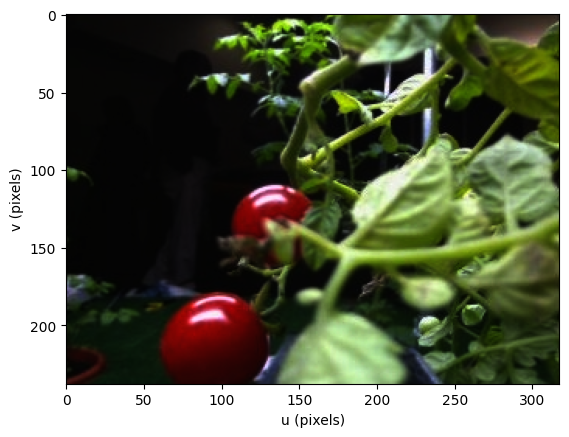

In [286]:
#garden = Image.Read("tomato_124.png", dtype="float", gamma="sRGB");
garden.disp();

In [289]:
tomato_blobs = tomatoes_binary.blobs() #Идентифицирует и извлекает блобы на бинарном изображении tomatoes_binary, предположительно содержащем помидоры.

┌───┬────────┬──────────────┬──────────┬───────┬───────┬────────┬────────┬────────┐
│id │ parent │     centroid │     area │ touch │ perim │ circul │ orient │ aspect │
├───┼────────┼──────────────┼──────────┼───────┼───────┼────────┼────────┼────────┤
│ 0 │     -1 │   8.9, 235.1 │       39 │  True │  37.9 │  0.380 │ -14.3° │   0.29 │
│ 1 │     -1 │  90.7, 206.5 │ 2.56e+03 │ False │ 201.5 │  0.880 │ -38.5° │  0.697 │
│ 2 │     -1 │ 130.2, 126.9 │ 1.14e+03 │ False │ 144.5 │  0.763 │ -21.3° │  0.531 │
└───┴────────┴──────────────┴──────────┴───────┴───────┴────────┴────────┴────────┘

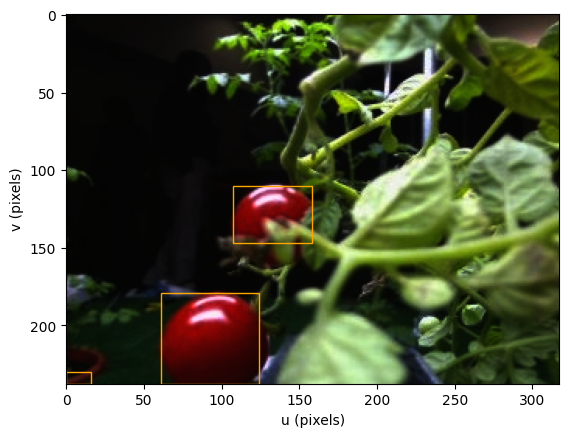

In [290]:
garden.disp(block=None) #Рисует ограничивающие рамки вокруг всех блобов
tomato_blobs.plot_box(color="orange")

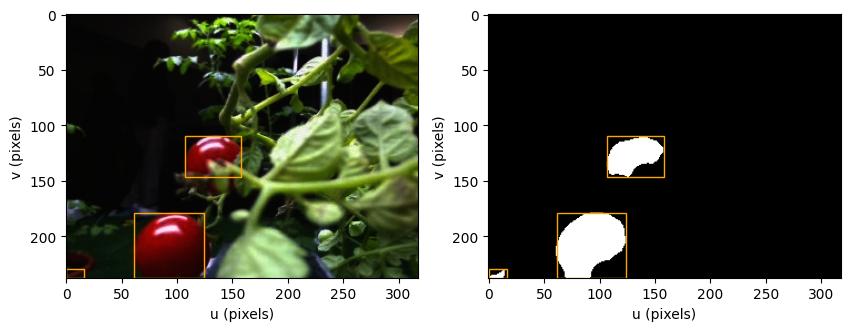

In [294]:
# Создаем фигуру и оси для двух графиков
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Отображаем первое изображение на первой оси
garden.disp(ax=axes[0], block=None)
tomato_blobs.plot_box(ax=axes[0], color="orange")

# Отображаем второе изображение на второй оси
tomatoes_binary.disp(ax=axes[1], block=None)
tomato_blobs.plot_box(ax=axes[1], color="orange")

# Отображаем графики
plt.show()

In [73]:
tomato_blobs.filter(area=(1_000, 5_000)) #Фильтрует блобы по площади, оставляя только те,
                                          #чья площадь находится в диапазоне от 1 000 до 5 000 пикселей.
                                          #Это позволяет исключить слишком маленькие и слишком большие объекты.

┌───┬────────┬──────────────┬──────────┬───────┬───────┬────────┬────────┬────────┐
│id │ parent │     centroid │     area │ touch │ perim │ circul │ orient │ aspect │
├───┼────────┼──────────────┼──────────┼───────┼───────┼────────┼────────┼────────┤
│ 1 │     -1 │  90.7, 206.5 │ 2.56e+03 │ False │ 201.5 │  0.880 │ -38.5° │  0.697 │
│ 2 │     -1 │ 130.2, 126.9 │ 1.14e+03 │ False │ 144.5 │  0.763 │ -21.3° │  0.531 │
└───┴────────┴──────────────┴──────────┴───────┴───────┴────────┴────────┴────────┘

In [74]:
tomato_blobs.filter(touch=False)   #Фильтрует блобы, чтобы оставить только те, которые не касаются границы изображения.
                                   #Это может быть полезно для исключения неполных объектов.

┌───┬────────┬──────────────┬──────────┬───────┬───────┬────────┬────────┬────────┐
│id │ parent │     centroid │     area │ touch │ perim │ circul │ orient │ aspect │
├───┼────────┼──────────────┼──────────┼───────┼───────┼────────┼────────┼────────┤
│ 1 │     -1 │  90.7, 206.5 │ 2.56e+03 │ False │ 201.5 │  0.880 │ -38.5° │  0.697 │
│ 2 │     -1 │ 130.2, 126.9 │ 1.14e+03 │ False │ 144.5 │  0.763 │ -21.3° │  0.531 │
└───┴────────┴──────────────┴──────────┴───────┴───────┴────────┴────────┴────────┘

In [309]:
tomato_blobs.filter(area=[1000, 5000], touch=False, color='dark salmon')
#tomato_blobs.filter(area=[1000, 5000], touch=False, color=1)
#Комбинирует несколько условий фильтрации для блобов: по площади,
#отсутствию касания краев изображения и, возможно, по цвету
#(хотя параметр color может быть специфичен для конкретной реализации и не иметь эффекта без дополнительного контекста).

┌───┬────────┬──────────┬──────┬───────┬───────┬────────┬────────┬────────┐
│id │ parent │ centroid │ area │ touch │ perim │ circul │ orient │ aspect │
├───┼────────┼──────────┼──────┼───────┼───────┼────────┼────────┼────────┤
└───┴────────┴──────────┴──────┴───────┴───────┴────────┴────────┴────────┘

### 12.1.3.5 Blob Hieararchy


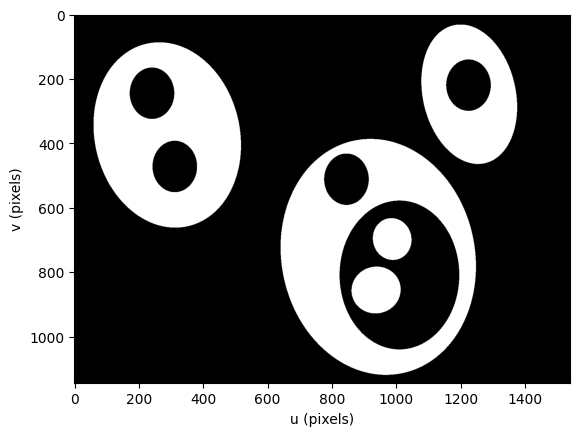

In [311]:
multiblobs = Image.Read("multiblobs.png");
multiblobs.disp();

In [312]:
labels, m = multiblobs.labels_binary() #Применяет бинарную сегментацию к изображению multiblobs,
                                        #генерируя матрицу меток labels для каждого пикселя и общее количество обнаруженных блобов m.
                                        #Этот процесс помогает в дальнейшей идентификации и анализе отдельных блобов.
m

6

In [315]:
labels

Image: 1541 x 1144 (int32)

In [313]:
blobs = multiblobs.blobs() #Извлекает все обнаруженные блобы из изображения multiblobs в виде списка объектов,
                           #каждый из которых содержит информацию о соответствующем блобе.

┌───┬────────┬───────────────┬──────────┬───────┬────────┬────────┬─────────┬────────┐
│id │ parent │      centroid │     area │ touch │  perim │ circul │  orient │ aspect │
├───┼────────┼───────────────┼──────────┼───────┼────────┼────────┼─────────┼────────┤
│ 0 │     -1 │  907.9, 735.1 │ 1.94e+05 │ False │ 2219.0 │  0.551 │ -103.6° │  0.814 │
│ 1 │      0 │ 1025.0, 813.7 │ 1.06e+05 │ False │ 1386.9 │  0.770 │  -90.0° │  0.802 │
│ 2 │      1 │  938.1, 855.2 │ 1.72e+04 │ False │  489.7 │  1.005 │  -12.5° │  0.945 │
│ 3 │      1 │  988.1, 697.2 │ 1.21e+04 │ False │  411.5 │  0.999 │ -102.8° │  0.919 │
│ 4 │      0 │  846.0, 511.7 │ 1.75e+04 │ False │  495.9 │  0.996 │  -90.1° │  0.871 │
│ 5 │     -1 │  291.7, 377.8 │  1.7e+05 │ False │ 1711.6 │  0.811 │ -102.9° │  0.775 │
│ 6 │      5 │  312.7, 472.1 │ 1.75e+04 │ False │  494.5 │  1.001 │  -90.2° │   0.87 │
│ 7 │      5 │  241.9, 245.0 │ 1.75e+04 │ False │  495.9 │  0.996 │  -90.1° │  0.871 │
│ 8 │     -1 │ 1228.0, 254.3 │ 8.14e+04 │ F

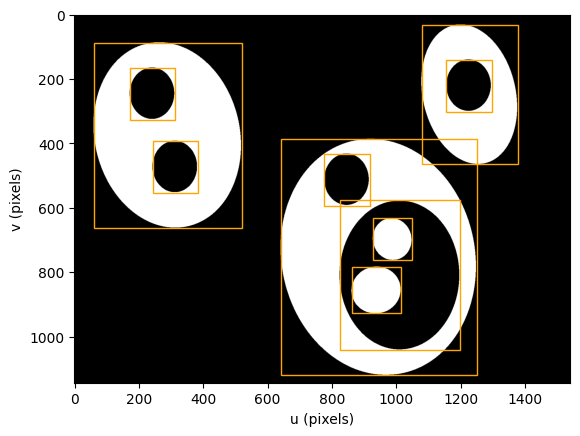

In [314]:
multiblobs.disp(block=None) #Рисует ограничивающие рамки вокруг всех блобов
blobs.plot_box(color="orange")

In [79]:
blobs[1].children #Возвращает список "дочерних" блобов для второго блоба в списке blobs.
                  #"Дочерние" блобы - это те, которые полностью содержатся внутри родительского блоба.


[2, 3]

In [80]:
blobs[1].parent
    #Возвращает "родительский" блоб для второго блоба в списке.
    #Родительский блоб - это тот, внутри которого полностью содержится данный блоб.
    #Если блоб не имеет родителя (т.е., не вложен в другой блоб),
    #может быть возвращено None или аналогичное значение.

0

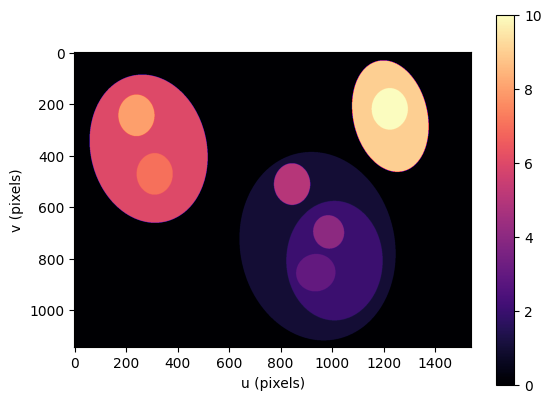

In [319]:
blobs.label_image().disp(colorbar=True, colormap="magma"); #Генерирует изображение, на котором каждый блоб окрашен в уникальный цвет
                            # в соответствии с его меткой, и отображает это изображение.
                            #Это позволяет визуально различать блобы и понимать их взаимное расположение.

In [ ]:
blobs.dotfile();
#Генерирует и, предположительно, отображает файл в формате DOT, который описывает
#иерархическую структуру блобов в виде графа. Команда show=True указывает на необходимость
#немедленного отображения сгенерированного графа.
#Это может потребовать дополнительных утилит для визуализации графов, таких как Graphviz.

### 12.1.3.6 Shape from Moments


In [83]:
blobs = sharks.blobs() #Извлекает блобы (связные области) из изображения sharks.
                       #Каждый блоб представляет собой область, которая отделена от фона и других объектов.


┌───┬────────┬──────────────┬──────────┬───────┬────────┬────────┬────────┬────────┐
│id │ parent │     centroid │     area │ touch │  perim │ circul │ orient │ aspect │
├───┼────────┼──────────────┼──────────┼───────┼────────┼────────┼────────┼────────┤
│ 0 │     -1 │ 245.6, 425.9 │ 1.85e+04 │ False │  811.2 │  0.392 │  -1.0° │  0.561 │
│ 1 │     -1 │ 502.3, 183.9 │ 7.51e+03 │ False │  514.8 │  0.396 │ -30.9° │  0.562 │
│ 2 │     -1 │  82.9, 159.6 │ 7.52e+03 │ False │  513.4 │  0.399 │  28.9° │  0.562 │
│ 3 │     -1 │ 297.0, 180.0 │ 1.44e+04 │ False │ 1235.4 │  0.132 │ -95.6° │  0.701 │
└───┴────────┴──────────────┴──────────┴───────┴────────┴────────┴────────┴────────┘

In [84]:
blobs.aspect #Возвращает соотношение сторон каждого блоба. Это числовое значение,
             #которое описывает пропорциональность геометрической формы блоба, например,
             #как близка форма блоба к квадрату или прямоугольнику.

array([  0.5609,   0.5619,    0.562,   0.7013])

In [85]:
blobs.humoments() #Вычисляет и возвращает моменты Ху для каждого блоба.
                  #Моменты Ху — это набор из семи чисел, инвариантных к масштабированию,
                  #повороту и переносу объекта, что делает их полезными для анализа формы объектов.

[array([    0.21,  0.01199, 0.001997, 0.0005748, 6.032e-07, 6.149e-05, 1.245e-07]),
 array([    0.21,  0.01193, 0.002015, 0.0005745, 6.045e-07, 6.115e-05, 1.291e-07]),
 array([  0.2097,  0.01189, 0.001979, 0.0005618, 5.801e-07, 5.989e-05, 1.199e-07]),
 array([  0.4705,  0.02568, 0.0006241, 1.115e-05, 9.217e-10, -1.041e-06, -1.232e-10])]

### 12.1.3.7 Shape from Perimeter


Форма на основе периметра

In [86]:
blobs[1].perimeter[:, :5] #Возвращает первые пять точек периметра второго блоба в списке blobs.
                          #Каждая точка периметра представлена координатами на изображении.

array([[559, 558, 558, 558, 557],
       [124, 125, 126, 127, 128]], dtype=int32)

In [87]:
blobs[1].perimeter.shape  #Возвращает размер массива периметра для второго блоба,
                          # что позволяет узнать общее количество точек,
                          # составляющих периметр этого блоба.


(2, 435)

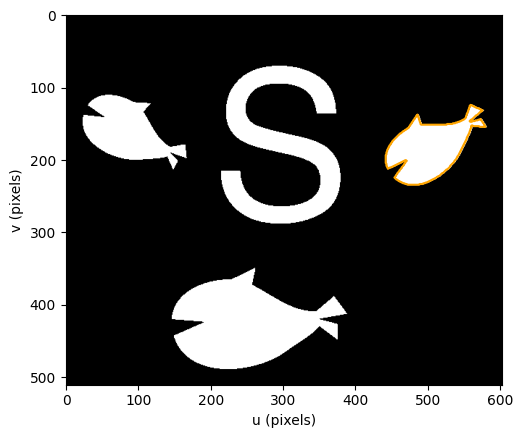

In [88]:
sharks.disp(block=None) #Отображает изображение sharks для визуального контекста.
                        #Параметр block=None может использоваться для немедленного отображения
                        #изображения без блокировки последующего кода.

blobs[1].plot_perimeter(color="orange") #Визуализирует периметр второго блоба на изображении,
                                        #используя оранжевый цвет. Это позволяет наглядно увидеть границы блоба.

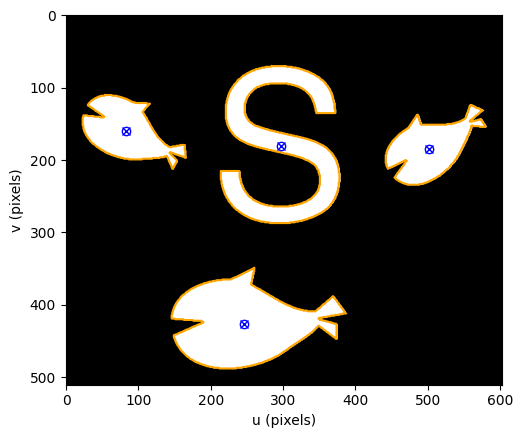

In [89]:
sharks.disp(block=None);
blobs.plot_perimeter(color="orange") #Визуализирует периметры всех блобов на изображении sharks,
                                     # используя оранжевый цвет. Позволяет наглядно оценить границы всех блобов.

blobs.plot_centroid()  #Визуализирует центроиды (центры масс) каждого блоба на изображении.
                       # Центроиды обычно рассчитываются на основе геометрических моментов.

In [90]:
p = blobs[1].perimeter_length #Сохраняет длину периметра второго блоба в переменную p.
                              # Это значение представляет общую длину границы блоба.

514.7716399431229

In [91]:
blobs.circularity #Возвращает значение круглости для каждого блоба.
                  #Круглость — это мера, которая описывает, насколько форма блоба близка к кругу.

array([  0.3923,   0.3962,    0.399,   0.1315])

In [92]:
p = Polygon2(blobs[1].perimeter).moment(0, 0) #Создает объект Polygon2 из периметра второго блоба
                                              #и вычисляет его нулевой момент (аналог площади).
                                              #Это демонстрирует использование геометрических моментов
                                              # для анализа формы объектов.

-7509.5

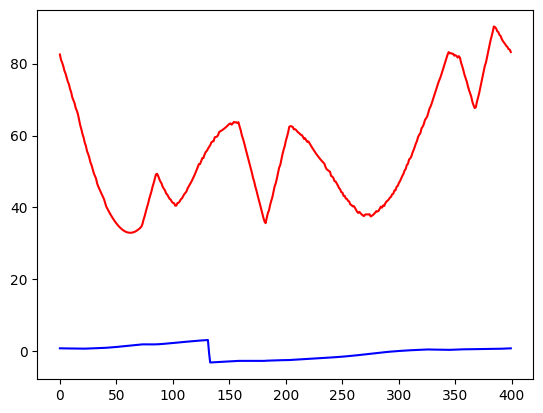

In [93]:
r, th = blobs[1].polar(); #Преобразует координаты периметра второго блоба в полярные координаты (r, th),
                          #где r — расстояние от центроида, а
                          #th — угол.
                          #Это может использоваться для анализа формы объекта.

plt.plot(r, "r", th, "b"); #Визуализирует полярные координаты периметра блоба на графике,
                           #используя красный цвет для радиальных расстояний и синий — для углов.

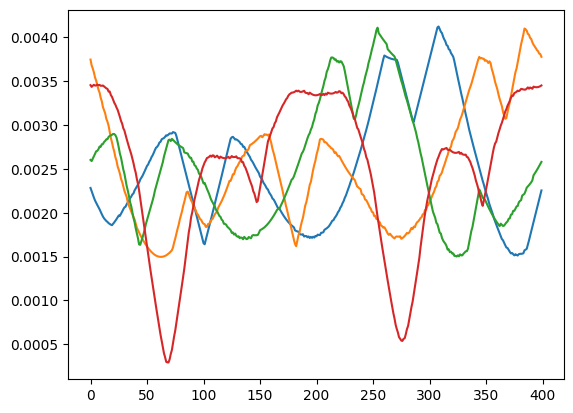

In [94]:
for blob in blobs:         #Перебирает все блобы, преобразует их периметры в полярные координаты
                          # и визуализирует нормализованные радиальные расстояния на графике.
                          #Нормализация позволяет сравнивать формы блобов независимо от их размера.
  r, theta = blob.polar()
  plt.plot(r / r.sum());

  #r, theta = blob.polar()
  #for blob in blobs:: Этот цикл перебирает каждый элемент в списке
        #blob.polar(): Вызывает метод .polar() для текущего объекта blob, который преобразует границу (периметр)
        # блоба из декартовых координат в полярные координаты.
           # В результате получаются два массива:
             #r содержит радиальные расстояния от центра (центроида) блоба до каждой точки на его границе,
              # а theta — соответствующие углы этих точек относительно центра

#plt.plot(r / r.sum());
#plt.plot(r / r.sum());: Использует библиотеку matplotlib для построения графика радиальных расстояний,
#нормализованных по их сумме.
   #Нормализация (r / r.sum()) приводит все значения r к диапазону от 0 до 1,
   #что позволяет сравнивать формы блобов независимо от их абсолютного размера.
   #Это особенно полезно, если блобы имеют различный масштаб, но схожую форму.
       # В данном контексте не указано, какие цвета или стили линий используются для отдельных блобов,
       #так что все они будут нарисованы с использованием стандартных настроек matplotlib.


In [95]:
similarity, _ = blobs.polarmatch(1) #Вызывает метод polarmatch для сравнения формы первого блоба
                                    #с формами других блобов на основе их полярного представления.
                                    #Возвращает меру сходства similarity и,
                                    #вероятно, индексы сопоставленных блобов
similarity


[0.9935607072378362,
 0.9999999999999999,
 0.9855577461902805,
 0.6434228605755373]

## 12.1.4 Object Detection using Deep Learning


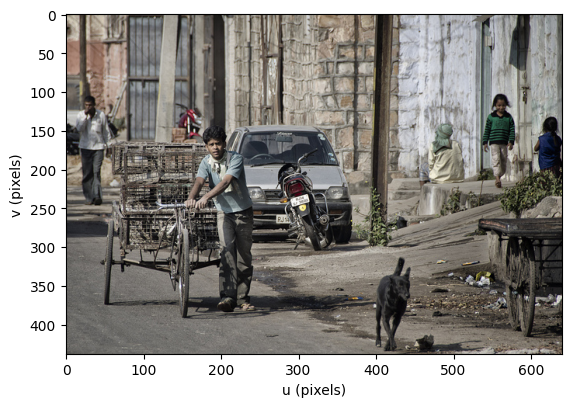

In [4]:
scene = Image.Read("image3.jpg")
scene.disp();

In [5]:
import torch
import torchvision as tv #модуль для работы с изображениями, torchvision.
transform = tv.transforms.ToTensor(); #Создает преобразование, которое конвертирует изображение
                                       #в тензор PyTorch, автоматически масштабируя пиксели к диапазону [0, 1].
in_tensor = transform(scene.image);   #Применяет созданное преобразование к изображению scene,
                                      #получая тензор in_tensor, который теперь готов к использованию в модели глубокого обучения.

In [98]:
#Загрузка и применение предварительно обученной модели
model = tv.models.detection.fasterrcnn_resnet50_fpn(pretrained=True).eval(); #Загружает предварительно обученную модель
                                                                #Faster R-CNN с ResNet-50 и FPN, переводит её в режим оценки (.eval()),
                                                                #что необходимо для корректной работы модели при обработке изображений.

outputs = model(torch.stack([in_tensor]));        #Оборачивает тензор изображения в дополнительное измерение
                                                  #(создает батч из одного элемента) и пропускает через модель.
                                                  #Получает outputs, содержащие результаты обнаружения объектов на изображении.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 88.4MB/s]


In [99]:
scores = outputs[0]["scores"].detach().numpy(); # Извлекает и преобразует в NumPy массив оценки уверенности
                                                # обнаруженных объектов. Оценки уверенности показывают
                                                #вероятность присутствия каждого объекта.

labels = outputs[0]["labels"].detach().numpy(); # Извлекает и преобразует в NumPy массив метки классов для каждого обнаруженного объекта.

boxes = outputs[0]["boxes"].detach().numpy();   # Извлекает и преобразует в NumPy массив координаты
                                                #ограничивающих рамок для каждого обнаруженного объекта.

In [100]:
len(scores)

42

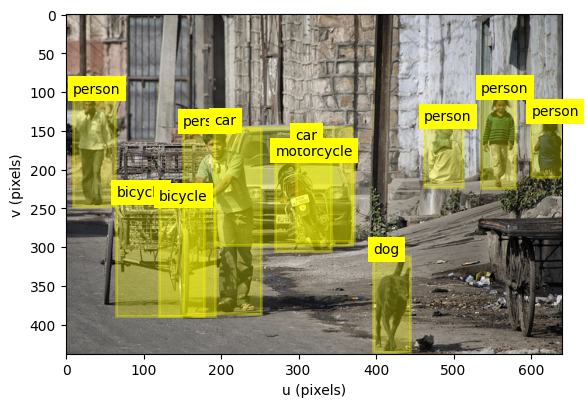

In [101]:
scene.disp(block=None); #Снова отображает исходное изображение, на котором будут нарисованы ограничивающие рамки и мет

#Словарь для сопоставления идентификаторов классов с их названиями
classname_dict = {1: "person", 2: "bicycle", 3: "car", 4: "motorcycle", 18: "dog"}; #словарь classname_dict используется для сопоставления числовых идентификаторов классов

for score, label, box in zip(scores, labels, boxes):   #цикле for одновременно итерируются массивы scores (уверенности обнаружения),
                                                       # labels (идентификаторы классов объектов) и boxes (координаты ограничивающих рамок).
                                                       # Цикл фильтрует обнаружения, оставляя только те, уверенность которых (score)
                                                       #превышает порог в 0.5. Это позволяет исключить менее достоверные обнаружения
                                                       # из визуализации.
  if score > 0.5:  # only confident detections
    plot_labelbox(classname_dict[label], lbrt=box, filled=True, alpha=0.3, #plot_labelbox(...): Эта функция отвечает за визуализацию
                                                                           #ограничивающей рамки для каждого достоверно обнаруженного объекта.
                                                                # classname_dict[label] преобразует числовой идентификатор класса в читаемое название
                                                                #Аргумент lbrt=box указывает координаты рамки ([x1, y1, x2, y2]).
                                                                    #Параметры filled=True, alpha=0.3
                                                                    #контролируют заливку рамки желтым цветом (color="yellow") с прозрачностью,
                                                                    #а linewidth=2 задает толщину границ рамки. Т


                  color="yellow", linewidth=2);

## 12.1.5 Summary
# 12.2 Line Features


In [7]:
points5 = Image.Read("5points.png", dtype="float");

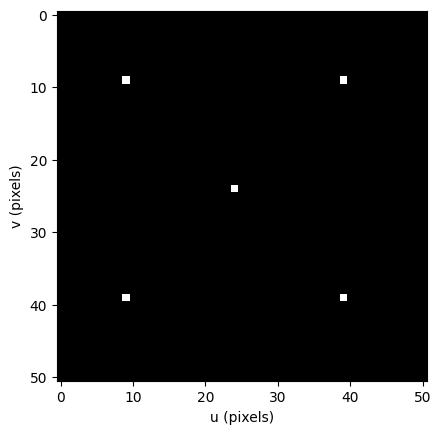

In [8]:
points5.disp()

In [30]:
square = Image.Squares(number=1, size=256, fg=128).rotate(0.3)
                        #Image.Squares(number=1, size=256, fg=128): Генерирует изображение с одним квадратом (number=1)
                        # заданного размера (size=256) и уровнем яркости (fg=128).
                          #.rotate(0.3): Поворачивает изображение с квадратом на угол 0.3 радиана
                          #относительно его центра, добавляя некоторую наклонность к квадрату.

Image: 256 x 256 (uint8)

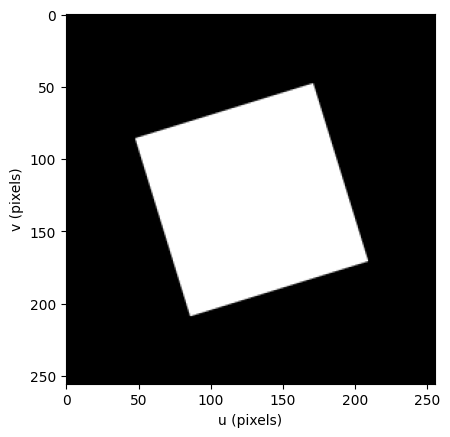

In [31]:
square.disp()


In [32]:
edges = square.canny(); #square.canny(): Применяет оператор Кэнни для обнаружения границ на изображении с квадратом.
                        # Результатом является изображение edges, где выделены контуры квадрата.

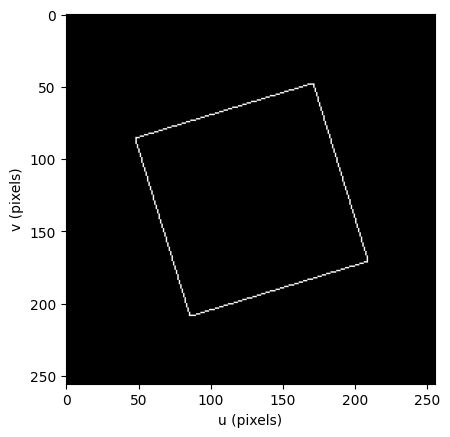

In [33]:
edges.disp()

In [34]:
h = edges.Hough(); #edges.Hough(): Выполняет преобразование Хафа для изображения edges для обнаружения линий.
                   # Возвращает объект h, содержащий информацию о накопителе голосов в пространстве Хафа,
                   #которое используется для определения прямых линий на изображении.
print(h)

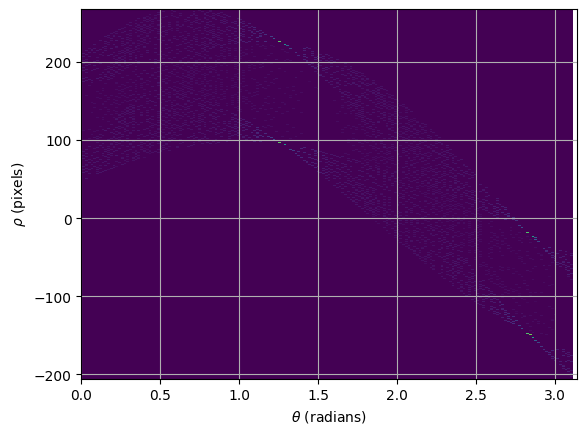

In [35]:
h.plot_accumulator() # Визуализирует накопитель голосов преобразования Хафа, показывая,
                     # как точки на изображении edges соответствуют прямым линиям.
                     #Это помогает понять, где на изображении находятся линии и как они ориентированы.

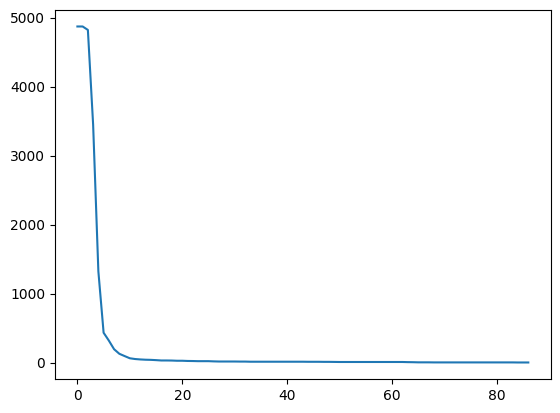

In [36]:
plt.plot(h.votes); # Строит график, показывающий распределение голосов по прямым линиям,
                   #обнаруженным с помощью преобразования Хафа. Каждая точка на графике отражает
                   # количество голосов для соответствующей линии


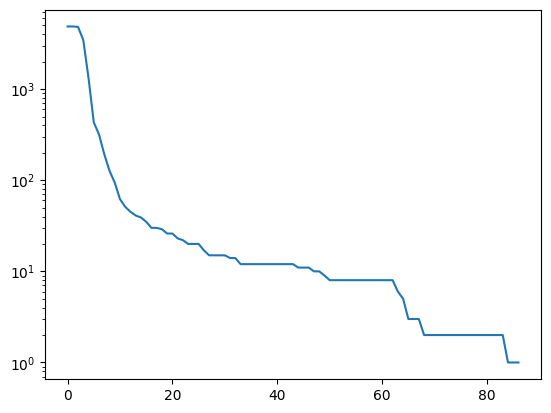

In [37]:
plt.plot(h.votes);
plt.yscale("log"); # Меняет масштаб оси Y на графике на логарифмический.
                    #Это может помочь в визуализации распределения голосов,
                    #особенно если они сильно различаются по величине.

In [38]:
lines = h.lines(60)   #h.lines(60): Извлекает линии из преобразования Хафа, которые получили более 60 голосов.
                      # Это пороговое значение помогает отфильтровать только наиболее значимые линии.
                      # Результатом является список lines, содержащий информацию о каждой линии, включая её параметры и количество голосов.

array([[   1.274,      224],
       [   1.274,       95],
       [   2.845,     -149],
       [   1.257,       97],
       [   1.257,      226],
       [   2.845,      -20],
       [   2.827,     -147],
       [   2.827,      -18]], dtype=float32)

In [56]:
church = Image.Read("church.png", mono=True)
edges = church.canny() #church.canny(): Применяет детектор границ Кэнни к монохромному изображению church

h = edges.Hough();     #Выполняет стандартное преобразование Хафа на изображении границ edges, подготавливая данные для последующего извлечения линий.

lines = h.lines_p(50, minlinelength=200, maxlinegap=5, seed=0); # Извлекает линии с помощью вероятностного преобразования Хафа.
                                                                  #Аргументы функции определяют порог (100) для значения аккумулятора,
                                                                  # минимальную длину линии (minlinelength=200),
                                                                  #максимальный разрыв между сегментами линии,
                                                                  #которые все еще считаются одной линией (maxlinegap=5),
                                                                  #и начальное значение для генератора случайных чисел (seed=0),
                                                                  #что обеспечивает воспроизводимость результатов.

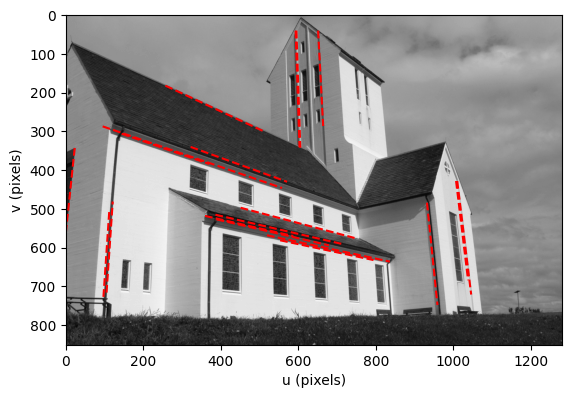

In [57]:
church.disp(block=None);
h.plot_lines(lines, "r--") #Визуализирует обнаруженные линии на изображении церкви,
                           #используя данные из объекта h (результат преобразования Хафа).
                           #Линии отрисовываются красным пунктиром ("r--"),

## 12.2.1 Summary
# 12.3 Point Features
## 12.3.1 Classical Corner Detectors


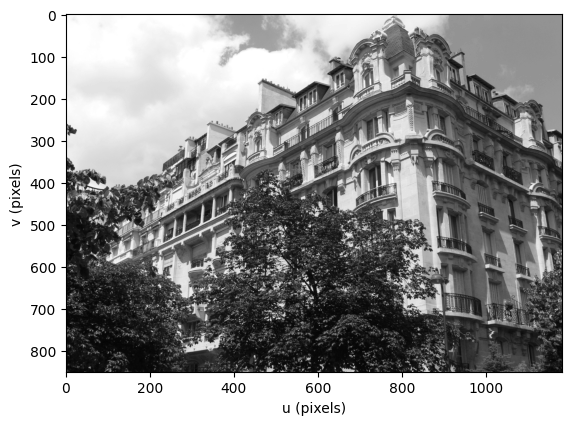

In [59]:
view1 = Image.Read("building2-1.png", mono=True);
view1.disp();

In [62]:
harris1 = view1.Harris(nfeat=500) #Применяет алгоритм Харриса к изображению view1 для обнаружения
                                  #до 500 наиболее выраженных углов (особенностей).


HarrisFeature features, 500 points

In [113]:
len(harris1)  #Возвращает количество обнаруженных углов, что помогает оценить общее число значимых особенностей на изображении.


500

In [114]:
harris1[0] #Доступ к первому углу (особенности) из списка обнаруженных алгоритмом Харриса.

HarrisFeature: (597.0, 648.0), strength=1.64, id=-1

In [63]:
harris1[0].p            #Возвращает координаты первого угла. Это позволяет понять, где на изображении расположена эта особенность.


array([[     597],
       [     648]])

In [64]:
harris1[0].strength     #Возвращает "силу" (значимость) первого угла, что может быть использовано для оценки его выраженности относительно других углов.

1.6357756853103638

In [116]:
harris1[:5].p # Возвращает координаты первых пяти углов
harris1[:5].strength  #Возвращает "силу" первых пяти углов.

array([   1.636,    1.532,    1.514,    1.487,    1.348])

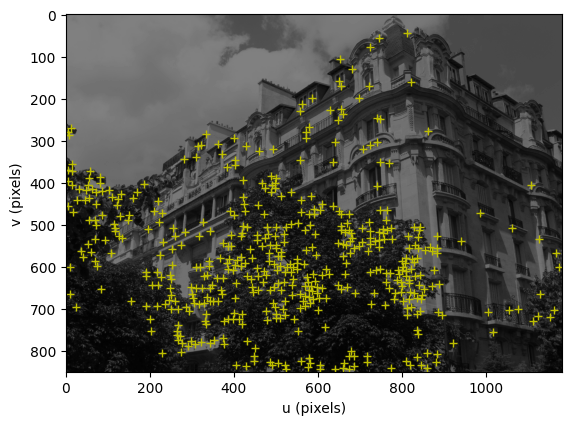

In [66]:
view1.disp(block=None, darken=True); #возможно с затемнением (darken=True),
harris1.plot(); #Визуализирует все обнаруженные углы на изображении

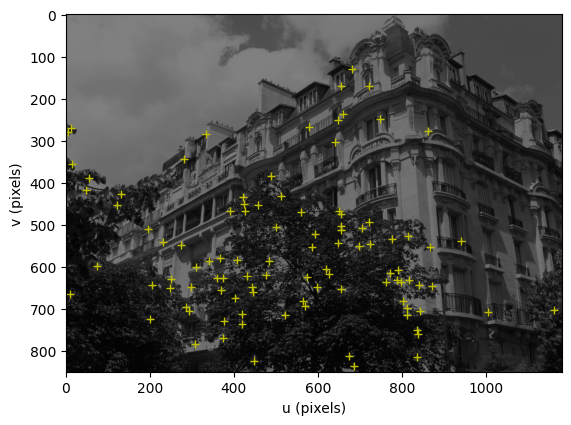

In [118]:
view1.disp(block=None, darken=True);
harris1[::5].plot()  #Визуализирует каждый пятый угол из списка обнаруженных,
                     #что помогает уменьшить перегруженность визуализации при большом количестве углов.

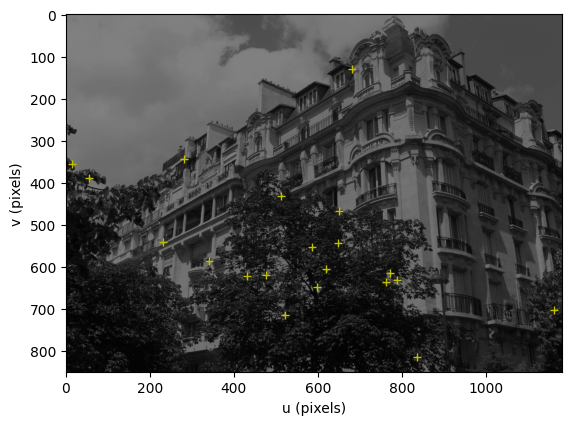

In [119]:
view1.disp(block=None, darken=True);
harris1.subset(20).plot() #Визуализирует подмножество из 20 обнаруженных углов.
                          #Метод subset позволяет выбрать конкретное число углов для отображения,

Настройка параметров алгоритма Харриса и визуализация угловой силы

In [83]:
harris1 = view1.Harris(nfeat=500, scale=15) #: Повторное применение алгоритма Харриса с указанием масштаба (scale=15).
                                            #Масштаб может влиять на чувствительность алгоритма к размеру углов,

HarrisFeature features, 500 points

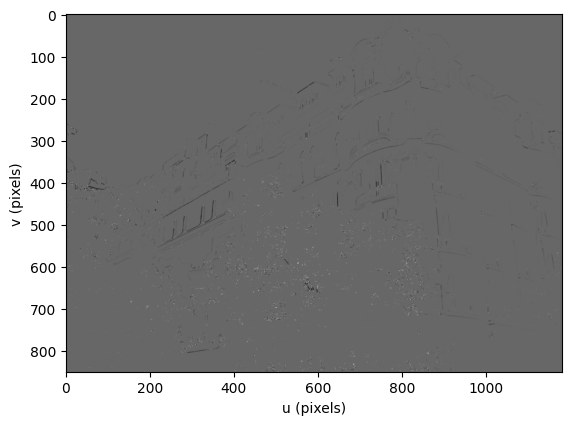

In [84]:
view1.Harris_corner_strength().disp(); #Визуализирует карту силы углов, созданную алгоритмом Харриса для изображения view1

In [87]:
view2 = Image.Read("building2-2.png", mono=True);

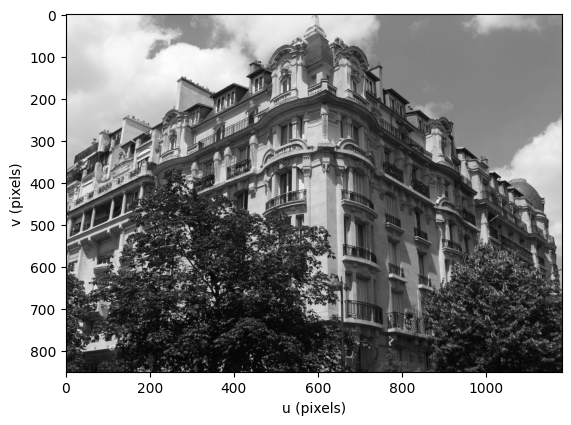

In [88]:
view2.disp()

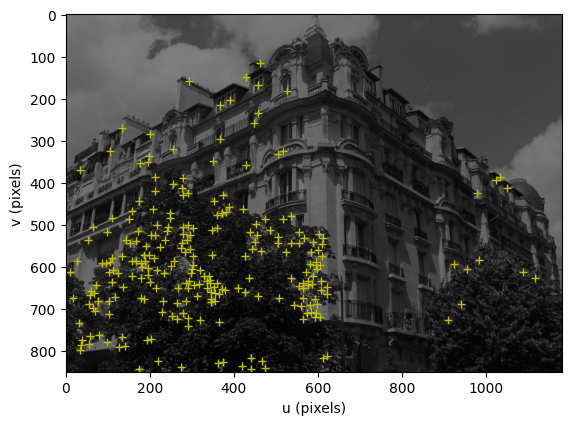

In [89]:
harris2 = view2.Harris(nfeat=250); #рименяет алгоритм Харриса к изображению, находящемуся в переменной view2,
                                   #для обнаружения до 250 особенностей (углов). Аргумент nfeat=250 задает
                                   # максимальное количество углов, которые следует обнаружить.
                                   #В результате получается объект harris2, содержащий информацию об обнаруженных углах,
                                   # включая их координаты и силу.
view2.disp(block=None, darken=True);
harris2.plot();

## 12.3.2 Scale-Space Corner Detectors


In [91]:
foursquares = Image.Read("scale-space.png", dtype="float");

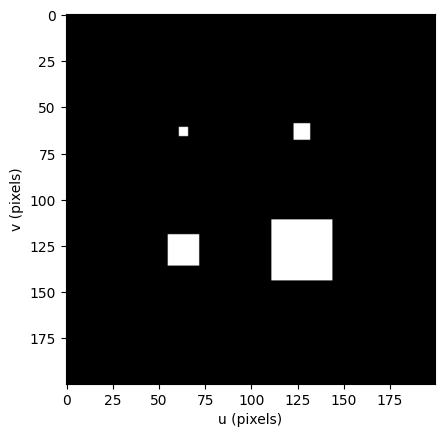

In [104]:
foursquares.disp()

In [92]:
G, L, s = foursquares.scalespace(60, sigma=2);  #Выполняет генерацию масштабного пространства для изображения foursquares,
                                                  #создавая серию уровней масштаба. Здесь
                                                  #60 указывает количество уровней масштаба,
                                                  #sigma=2 - начальное значение стандартного отклонения для гауссовского размытия.
                                                  #G содержит изображения после гауссовского размытия на каждом уровне,
                                                  #L - изображения Лапласианов после применения оператора Лапласа к G,
                                                  #s - массив масштабных коэффициентов.

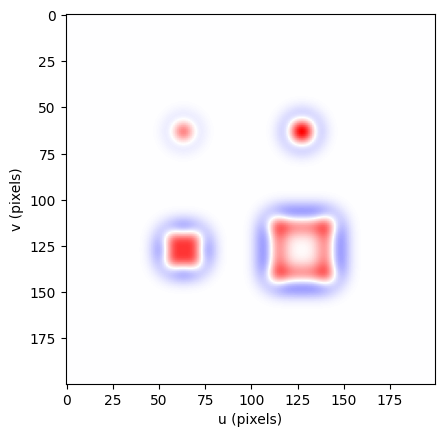

In [106]:
L[5].disp(colormap="signed"); #Визуализирует Лапласиан изображения на пятом уровне масштабного пространства (L[5]),
                              # используя цветовую карту, которая различает положительные и отрицательные значения.


In [127]:
s[5] #Выводит значение масштабного коэффициента для пятого уровня масштабного пространства,
     #что дает понимание масштаба, на котором производилось размытие.


4.5

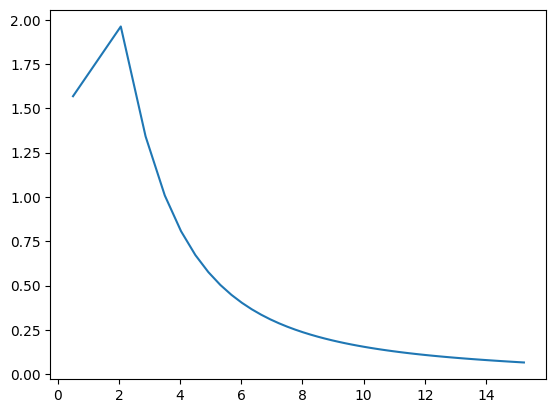

In [107]:
plt.plot(s[:-1], [-Ls.image[63, 63] for Ls in L]); #Строит график, показывающий изменение амплитуды Лапласиана
                                                   #в центральной точке изображения ([63, 63]) на разных уровнях масштаба.
                                                   # Использует отрицательные значения амплитуды для удобства визуализации.
                                                   # Это позволяет анализировать, как особенности изменяются в зависимости от масштаба.

In [109]:
features = findpeaks3d(np.stack([np.abs(Lk.image) for Lk in L], axis=2), npeaks=4)
              #Ищет максимальные точки (пики) в трехмерном массиве, созданном из абсолютных значений Лапласианов
              #на разных уровнях масштаба, что позволяет обнаружить до 4 наиболее значимых особенностей на изображении.

array([[      63,       63,        1,    1.962],
       [      63,      127,        2,    1.716],
       [     127,       63,       11,    1.514],
       [     127,      127,       43,     1.46]])

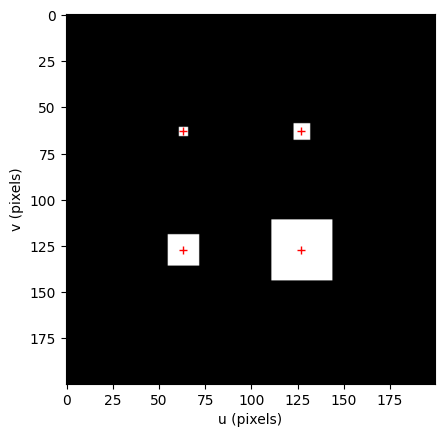

In [111]:
foursquares.disp(block=None);
for feature in features:
  plt.plot(feature[0], feature[1], 'r+')

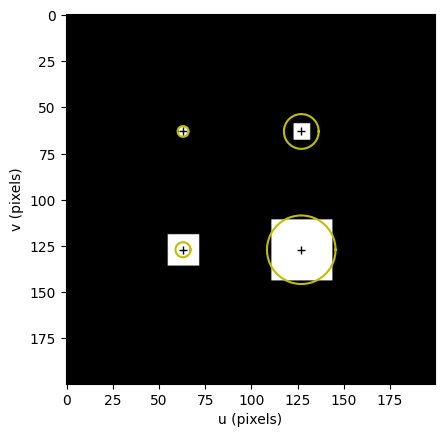

In [130]:
foursquares.disp(block=None);
for feature in features:
  plt.plot(feature[0], feature[1], 'k+') #Эта строка использует библиотеку matplotlib для построения графика,
                                         #где feature[0] и feature[1] обозначают координаты X и Y особенности на изображении соответственно.
                                         #Символ 'k+' указывает на то, что точка будет отмечена крестом ('+') черного цвета ('k').

  scale = s[int(feature[2])]       #Извлекает масштаб особенности из массива масштабных коэффициентов s,
                                  #где feature[2] содержит индекс масштабного уровня, на котором была найдена данная особенность.
                                       # Это значение масштаба указывает на "размер" особенности в контексте масштабного пространства,
                                       # позволяя адаптировать размер визуализируемой окружности к масштабу особенности.

  plot_circle(radius=scale * np.sqrt(2), centre=feature[:2], color="y") #Рисует окружность вокруг локации особенности с радиусом,
                                                                        #пропорциональным найденному масштабу.
                                                                        #Радиус окружности radius=scale * np.sqrt(2) умножается на np.sqrt(2)
                                                                        #для корректировки размера окружности таким образом,
                                                                        #чтобы она соответствовала характерному размеру особенности.
                                                                        #centre=feature[:2] задает центр окружности на основе координат особенности,
                                                                        # а color="y" определяет цвет окружности как желтый.
                                                                          #Это позволяет визуально оценить не только позицию,
                                                                          #но и примерный размер или "значимость" особенности на изображении.

In [112]:
mona = Image.Read("monalisa.png", dtype="float");

In [113]:
G, L, _ = mona.scalespace(8, sigma=8);
          #mona.scalespace(8, sigma=8): Создает масштабное пространство для изображения mona,
          # используя 8 уровней масштаба с начальным значением sigma=8.
          #Функция возвращает три объекта:
           #G - серия изображений после применения гауссовского размытия на каждом уровне масштаба,
             #что помогает выявить структуры на разных уровнях детализации.

          #L - серия изображений Лапласиана (результат применения оператора Лапласа к G),
             #которые выделяют границы и углы на разных уровнях масштаба.

          # _ (пропущенная переменная) - здесь используется для игнорирования третьего возвращаемого значения функции, если оно есть.

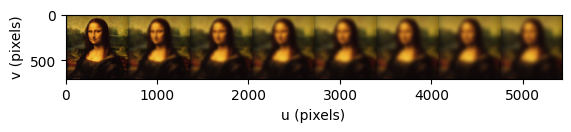

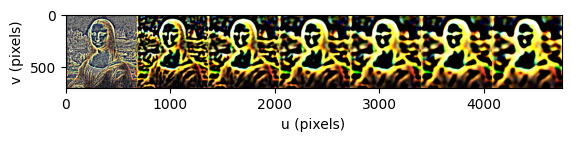

In [114]:
Image.Hstack(G).disp(); #создает новое изображение путем горизонтального объединения всех изображений из списка G,
                           #что позволяет визуализировать эффекты гауссовского размытия на разных уровнях масштаба в
                           #одном объединенном представлении

Image.Hstack(L).disp();  #создает новое изображение путем горизонтального объединения всех изображений Лапласиана из списка L.
                           #Это представление позволяет наглядно сравнить,
                           #как углы и границы объектов выделяются на различных уровнях масштаба


### 12.3.2.1 Scale-Space Point Feature


In [118]:
#Обнаружение особенностей с помощью SIFT
sift1 = view1.SIFT(nfeat=200)  #Применяет алгоритм SIFT к изображению, находящемуся в переменной view1,
                                 #для обнаружения до 200 особенностей.
                                 #SIFT выявляет ключевые точки на изображении,
                                 #которые инвариантны к масштабированию и повороту,
                                 #делая их полезными для многих задач компьютерного зрения.

SIFTFeature features, 200 points

In [135]:
sift1[0] #Получает первую особенность из списка обнаруженных особенностей SIFT.
         #Это демонстрирует, как можно получить доступ к отдельным особенностям
         #после выполнения алгоритма SIFT.

SIFTFeature: (2.3, 285.4), strength=0.05, scale=2.1, orient=2.6°, id=-1

Actually, those SIFT features are very small and associated with the leafs on the trees along the left-hand edge.  Let's select out the bigger and strong SIFT features.

Этот комментарий и следующий код описывают повторное выполнение алгоритма SIFT без ограничения на количество особенностей, а затем фильтрацию результатов для выбора только больших и сильных особенностей. Фильтрация осуществляется по двум критериям: percentstrength=50 (особенности, чья сила выше 50-го процентиля силы всех особенностей) и minscale=5 (особенности, размер которых превышает 5 в терминах масштаба SIFT).

In [136]:
sift1 = view1.SIFT().filter(percentstrength=50, minscale=5)
                              #percentstrength=50 (особенности, чья сила выше 50-го процентиля силы всех особенностей)
                              #minscale=5 (особенности, размер которых превышает 5 в терминах масштаба SIFT).

SIFTFeature features, 193 points

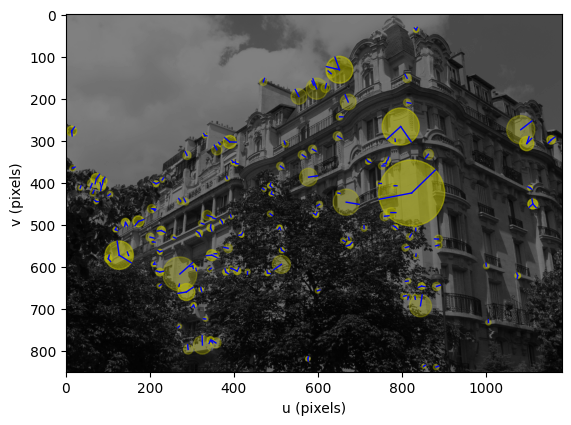

In [137]:
view1.disp(block=None, darken=True);
sift1.plot(filled=True, color="y", hand=True, alpha=0.3) # Визуализирует отфильтрованные особенности SIFT на изображении,
                                 # используя желтые маркеры (color="y").
                                 #Параметры filled=True и alpha=0.3 указывают на заливку маркеров желтым цветом с прозрачностью 0.3,
                                 #в то время как hand=True может быть специфичным для конкретной реализации и требует уточнения

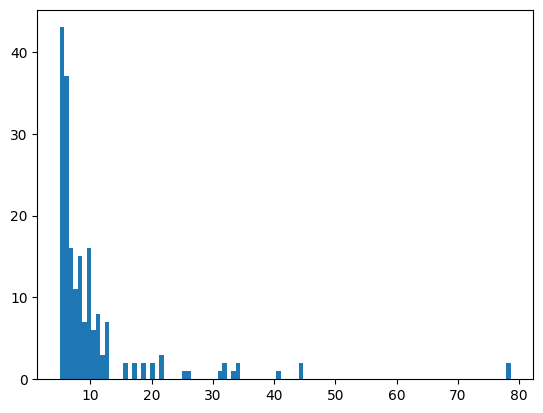

In [138]:
plt.hist(sift1.scale, bins=100); #Строит гистограмму распределения масштабов отфильтрованных особенностей SIFT,
                                 # используя 100 бинов.
                                 # Это позволяет анализировать, на каких масштабах
                                 #чаще всего встречаются значимые особенности на изображении.

# 12.4 Applications
## 12.4.1 Character Recognition


 (OCR, Optical Character Recognition) на изображении с помощью библиотеки Tesseract через Pytesseract в Python. В частности, демонстрируется обработка изображения

In [115]:
if COLAB:
    !sudo apt install tesseract-ocr #Установка Tesseract OCR (Только для Google Colab)
    !pip install pytesseract

try:
    import pytesseract as tess #Импорт Pytesseract и Обработка Исключений
except ModuleNotFoundError:
    print("please install pytesseract:\n * install tesseract binary, see https://tesseract-ocr.github.io/tessdoc/Installation.html\n * pip install pytesseract")
penguins = Image.Read("penguins.png");
ocr = tess.image_to_data(penguins.image < 100, output_type=tess.Output.DICT); #Применение OCR для Распознавания Текста
        #Применяет функцию image_to_data из Pytesseract к изображению,
        # предварительно преобразовав его в бинарное (черно-белое) с пороговым значением 100
        # для выделения текста. output_type=tess.Output.DICT указывает, что результат должен быть возвращен в виде словаря.


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 35 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 0s (10.9 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debco

In [119]:
#Вывод Распознанного Текста
for confidence, text in zip(ocr["conf"], ocr["text"]): #Перебирает значения уверенности (conf) и текст (text), извлекая их из
                                                       #результатов OCR. Выводит текст и соответствующее значение уверенности,
                                                       #если текст не пустой и уверенность больше 0.
  if text.strip() != "" and float(confidence) > 0:
    print(confidence, text)

96 Table
95 Mountain
95 National
96 Park
96 Warning
96 Please
96 look
96 under
96 your
96 vehicles
96 for
95 penguins
96 Sponsored
97 by
96 Boulders
7 a
96 Beach
79 5
44 =
33 mae
95 Lodge
14 ————————


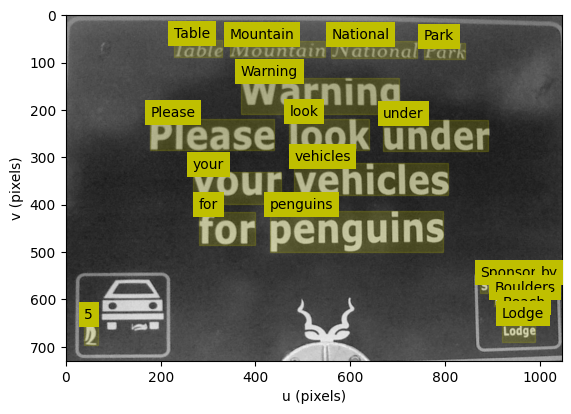

In [141]:
penguins.disp(block=None)
for i, (text, confidence) in enumerate(zip(ocr["text"], ocr["conf"])):
                             #enumerate(zip(ocr["text"], ocr["conf"])): Этот оператор создает итерируемый объект,
                             #который содержит пары (text, confidence)
                             #для каждого элемента из списков ocr["text"] (текст, распознанный на изображении) и
                             #ocr["conf"] (уверенность в распознавании каждого текстового фрагмента).
                             #enumerate добавляет индекс i к каждой паре,
                             #который используется для доступа к соответствующим координатам и размерам текстовых блоков.

  if text.replace(" ", "") != "" and float(confidence) > 50: #Условие фильтрации текста и уверенности
                              #Это условие проверяет, что текст не состоит только из пробелов (text.replace(" ", "") != "")
                              # и что значение уверенности (confidence) больше 50.
                              #Это позволяет отфильтровать незначительные распознавания и оставить только текст
                              #с относительно высокой уверенностью в его точности.

    plot_labelbox(text,  #plot_labelbox(...): Эта функция, вероятно, предназначена для отрисовки
                         #прямоугольников вокруг распознанных текстовых фрагментов. Параметры функции задают:
                         #text: Текст для отображения внутри или рядом с прямоугольником.


       lb=(ocr["left"][i], ocr["top"][i]), wh=(ocr["width"][i], ocr["height"][i]),
                                #lb=(ocr["left"][i], ocr["top"][i]): Координаты левого верхнего угла прямоугольника,
                                # взятые из результатов OCR. Это начальная точка для отрисовки прямоугольника.
                                    #wh=(ocr["width"][i], ocr["height"][i]): Ширина и высота прямоугольника,
                                    #также взятые из результатов OCR. Они определяют размер прямоугольника.

       color="y", filled=True, alpha=0.2)   #color="y": Цвет прямоугольника задается желтым ("y").
                                            #filled=True: Указывает, что прямоугольник должен быть заливкой.
                                            #alpha=0.2: Уровень прозрачности заливки прямоугольника.
                                            #Значение 0.2 обеспечивает небольшую прозрачность,
                                            #чтобы текст и прямоугольник не полностью скрывали изображение под собой.

## 12.4.2 Image Retrieval


In [122]:
images = ImageCollection("campus/*.png", mono=True);

In [123]:
#Итерирует по каждому изображению в коллекции images, применяя к каждому алгоритм SIFT
#для извлечения особенностей.
#Собирает все найденные особенности в общий список features.
features = [];
for image in images:
  features += image.SIFT()
features.sort(by="scale", inplace=True); #Сортирует список особенностей features по масштабу (scale).
                                         #Масштаб особенности указывает на размер области изображения,
                                         #с которой она ассоциирована, и является ключевым параметром для масштабно-инвариантных методов,
                                         #таких как SIFT.

In [124]:
len(features) #Выводит общее количество найденных и сортированных особенностей.

42211

In [125]:
features[:10].table() #Создает и отображает таблицу, содержащую информацию о
                      #первых десяти особенностях из отсортированного списка.

┌──┬──────────────┬──────────┬────┐
│# │     centroid │ strength │ id │
├──┼──────────────┼──────────┼────┤
│0 │ 347.5, 175.5 │   0.0307 │  4 │
│1 │ 418.1, 298.0 │   0.0239 │  9 │
│2 │ 462.7, 270.4 │   0.0371 │  7 │
│3 │ 500.6, 261.2 │   0.0251 │ 15 │
│4 │  291.6, 90.8 │   0.0391 │  5 │
│5 │ 521.3, 286.3 │   0.0246 │  3 │
│6 │ 521.3, 286.3 │   0.0246 │  3 │
│7 │ 510.4, 113.8 │   0.0239 │  3 │
│8 │ 130.9, 110.5 │   0.0291 │ 11 │
│9 │ 130.9, 110.5 │   0.0291 │ 11 │
└──┴──────────────┴──────────┴────┘



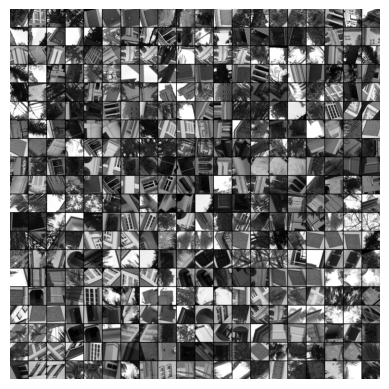

In [126]:
supports = [];
for feature in features[:400]:                   #Для первых 400 особенностей из списка features вызывает метод support,
                                                  # который возвращает "поддерживающие" изображения — те изображения из коллекции,
                                                  #которые соответствуют данной особенности.
                                                  #Собирает эти изображения в список supports.
   supports.append(feature.support(images))

Image.Tile(supports, columns=20).disp(plain=True);  #Создает мозаику из поддерживающих изображений,
                                                    #размещая их в виде плитки с 20 столбцами.
                                                    #Аргумент plain=True может указывать на отображение
                                                    #без дополнительных оформлений или метаданных.
                                                    #Отображает эту мозаику для визуальной оценки.

In [151]:
#Визуализация Конкретной Особенности
feature = features[108] #Из списка features, содержащего особенности из всех изображений коллекции,
                         #выбирается одна особенность (с индексом 108).
                         #Затем отображается изображение, к которому эта особенность принадлежит

SIFTFeature: (445.3, 337.2), strength=0.03, id=19

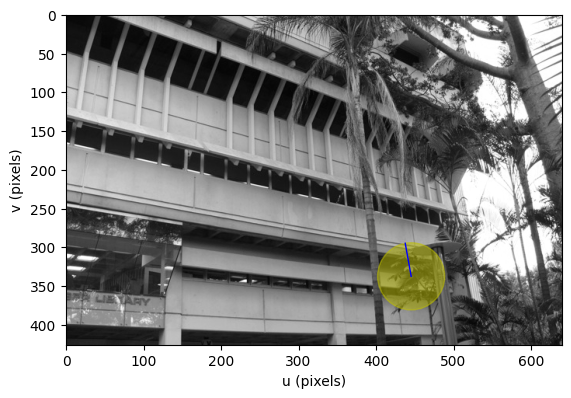

In [152]:
images[feature.id].disp(block=None); #Это позволяет увидеть контекст появления особенности на изображении.
feature.plot(filled=True, color="y", hand=True, alpha=0.5) #Визуализирует выбранную особенность на изображении,
                                                            #используя желтый цвет (color="y"),
                                                            #с некоторой степенью прозрачности (alpha=0.5).
                                                            #filled=True указывает на заливку маркера,
                                                            #а hand=True может быть специфичным параметром для данного метода plot.

In [153]:
#Создание и Анализ "Мешка Слов"
bag = BagOfWords(features, 2_000, seed=0) #Создает модель "мешка слов" из списка features,
                                          #используя 2000 "слов" (уникальных особенностей или кластеров особенностей).
                                          #seed=0 обеспечивает воспроизводимость результатов.

BagOfWords: 42211 features from 20 images, 2000 words, 0 stop words

In [154]:
w = bag.word(110) #Извлекает "слово" (или кластер особенностей), соответствующее особенности с индексом 108.

1585

In [155]:
bag.occurrence(w) # возвращает количество появлений "слова" w во всех изображениях.

44

In [156]:
bag.contains(w) #возвращает список булевых значений, указывающих, содержится ли "слово" w в каждом изображении коллекции.

array([ 0,  1,  2,  5,  7,  8,  9, 10, 11, 12, 14, 15, 16, 17, 18, 19])

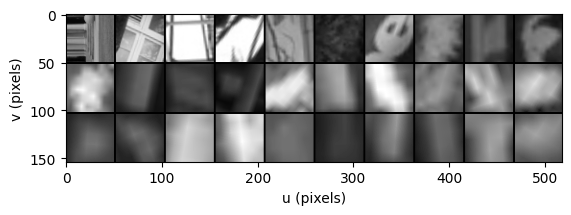

In [157]:
bag.exemplars(w, images).disp(); #Отображает изображения, которые содержат "слово" w,
#позволяя визуально оценить, как эта особенность проявляется в различных частях коллек

In [158]:
#Анализ Частоты Слов и Визуализация
word, freq = bag.wordfreq(); #Возвращает два массива: идентификаторы "слов" и их частоты появления в коллекции.

In [159]:
np.max(freq) #Вычисляет максимальную и медианную частоту появлений "слов" среди всех изображений.
np.median(freq)

13.0

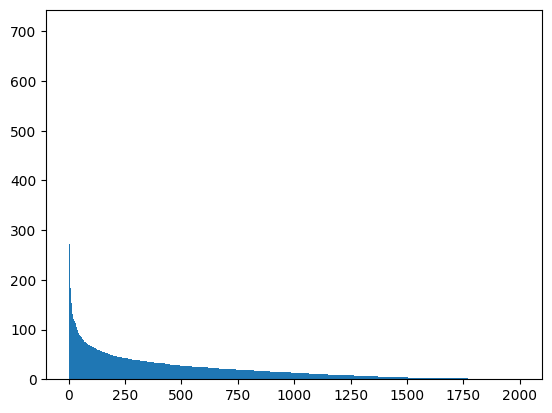

In [160]:
plt.bar(word, -np.sort(-freq), width=1);  # sort in descending order
#Строит гистограмму частот "слов" в порядке убывания. Показывает, как часто встречаются различные "слова" в коллекции.

In [161]:
#Фильтрация "Слов" с Созданием Стоп-Слов
bag = BagOfWords(features, 2_000, nstopwords=50, seed=0) #Повторно создает модель "мешка слов",
                                                         # на этот раз исключая 50 наиболее часто встречающихся "слов"
                                                         #как стоп-слова (nstopwords=50). Это помогает уменьшить влияние
                                                         #очень общих особенностей, которые могут не нести значимой информации
                                                         #для различения изображений.

Removing 7517 features (17.8%) associated with 50 most frequent words


BagOfWords: 240 features from 20 images, 1950 words, 50 stop words

In [162]:
v10 = bag.wwfv(10); #Вызывает метод wwfv (word-weighted feature vector) объекта bag,
                     #чтобы получить взвешенный вектор особенностей для изображения с индексом 10 в коллекции.
                     #Этот вектор представляет собой числовое представление содержимого изображения в терминах "мешка слов"

v10.shape          #Выводит размерность полученного вектора особенностей v10, что дает представление о количестве "слов" в модели.

(1950, 1)

In [163]:
#Оценка Сходства Между Изображениями
sim_10 = bag.similarity(v10); # Вычисляет сходство вектора v10 с векторами всех изображений в коллекции,
                                #используя модель "мешка слов".
                                #Результат sim_10 содержит массив сходства v10 с каждым изображением.

In [164]:
k = np.argsort(-sim_10) #Сортирует индексы изображений в порядке убывания сходства с v10,
                        #таким образом, первые индексы в k указывают на изображения,
                        # наиболее похожие на изображение с индексом 10.

array([10, 17, 16, 12,  2, 15, 11, 14,  5,  1,  9,  8,  4, 18,  3, 19, 13,  7,  6,  0])

In [174]:
query = ImageCollection("campus/holdout/*.png", mono=True);

In [166]:
S = bag.similarity(query); #Вычисляет сходство каждого изображения запроса из query
                           #с каждым изображением в исходной коллекции, используя модель "мешка слов".

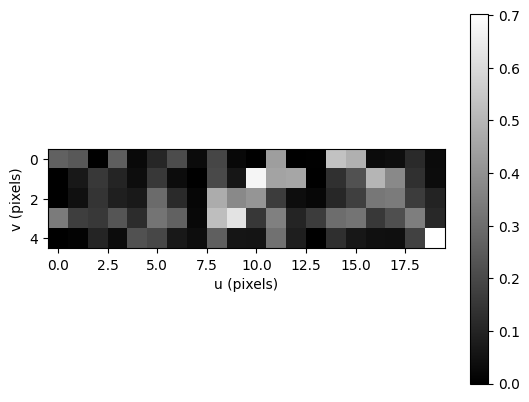

In [167]:
Image(S).disp(colorbar=True); #Отображает матрицу сходства S в виде изображения
                              #с цветовой шкалой (colorbar), где каждая строка соответствует
                              #изображению запроса, а столбцы — изображениям в коллекции.
                              #Яркость пикселя отражает степень сходства.

In [168]:
np.argmax(S, axis=1) #Используя функцию np.argmax,
                      #находит индекс изображения в коллекции,
                      #которое имеет наивысшее сходство с каждым из изображений запроса.

array([14, 10,  8,  9, 19])

In [169]:
bag.retrieve(query[0]) #Метод retrieve модели "мешка слов" используется для извлечения
                       #и возврата наиболее подходящих изображений из коллекции для заданных
                       # изображений запроса (query[0], query[1]). Это позволяет определить,
                       # какие изображения в коллекции наиболее схожи с каждым из запросов.
bag.retrieve(query[1])

(10, 0.6737740043104137)